In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score, confusion_matrix, make_scorer, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split
from scipy.cluster import hierarchy
from scipy.stats import ttest_rel, f_oneway
from matplotlib.colors import ListedColormap

warnings.filterwarnings("ignore")

[Link al Notebook de Curación de Datos](https://colab.research.google.com/drive/1Be4rNkCPfo1Rw2AWwxDiSk6eilOwQ_9d#scrollTo=EGc08TG_NmWw)

El set de datos a utilizar se compone de jugadores de Futbol, las posiciones en las que juegan en la cancha y las valoraciones numéricas de sus atributos.

Este set de datos se divide en 3 partes:

*   **df_24** : Compuesto por jugadores cuyos atributos  fueron medidos durante el año 2024 y tienen una sola posicion asignada.

*   **df_25** : Compuesto por jugadores cuyos atributos fueron medidos durante el año 2024 y tienen una sola posicion asignada. Se diferencian de los jugadores de **df_24** en que estos no aparecen en el set de datos del año 2024, es decir, son jugadores nuevos.

*   **df_24_multi** : Son jugadores cuyos atributos fueron medidos durante el año 2024, pero tienen asignados mas de una posicion en la cancha.

La idea del trabajo es entrenar varios modelos para clasificar la posicion de un jugador en base a sus atributos, probarlos con los jugadores nuevos del año 2025, elegir el mejor modelo de todo y usarlo para asignarle una sola posición a los jugadores "**indecisos**" de **df_24_multi** .

In [ ]:
df_24 = pd.read_csv('df_24.csv')
df_24_multi = pd.read_csv('df_24_multi.csv')
df_25 = pd.read_csv('df_25.csv')

In [ ]:
#Elimino la columna de nombre ya que no será utilizada
df_24 = df_24.drop(columns=['Nombre'])
df_24_multi = df_24_multi.drop(columns=['Nombre'])
df_25 = df_25.drop(columns=['Nombre'])

In [ ]:
#Preparo los datos para la visualización
X = df_24.select_dtypes(include=[np.number])
pos_24 = df_24['Posición']

scaler = StandardScaler()
data_24 = scaler.fit_transform(X)

palette_4colors = {
    'Defensor': '#FF0000',    # Rojo
    'Mediocampista': '#0000FF', # Azul
    'Delantero': '#00FF00',    # Verde
    'Arquero': '#8000FF' # Morado
}

Como primer paso, se realizó la visualizacion de los datos para entender su distribución. Los histogramas permiten ver que características son las que diferencian a las posiciones de los jugadores.

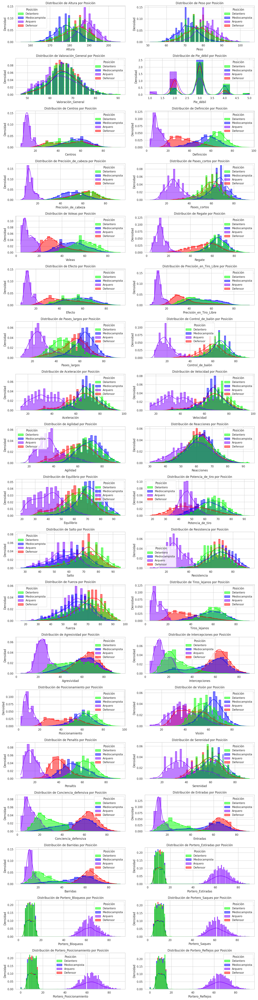

In [ ]:
numeric_cols = df_24.select_dtypes(include=[np.number]).columns

sns.set(style="whitegrid")
plt.figure(figsize=(15, 60))

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols)//2 + 1, 2, i)

    sns.histplot(data=df_24,
                 x=col,
                 hue='Posición',
                 element='step',
                 stat='density',
                 common_norm=False,
                 kde=True,
                 palette=palette_4colors,
                 alpha=0.5)

    plt.title(f'Distribución de {col} por Posición')
    plt.xlabel(col)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

Viendo los histogramas puede verse que hay características que diferencian bien las posiciones de "de a pares", es decir, hay características que separan bien una posicion del resto de posiciones. En particular la posición que mas se diferencia de ls demás es la del Arquero.

Para tener una imagen mas general de la ubicacion de los datos se realizaron las visualizaciones t-SNE y PCA con las primeras 2 componentes principales, para ver todos los datos en un espacio de 2 dimensiones.

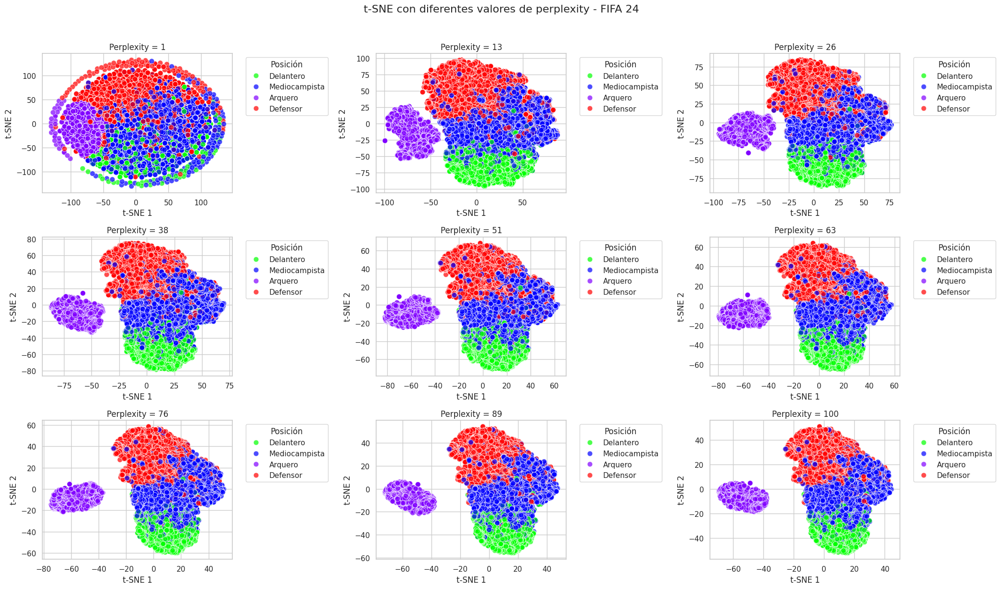

In [ ]:
#No se recomienda ejecutar esta celda
#Solo se usó para buscar el valor de "perplexity" que mejora la visualizacion de los datos
'''
perplexities = [1, 13, 26, 38, 51, 63, 76, 89, 100]

fig, axes = plt.subplots(3, 3, figsize=(21, 12))
fig.suptitle('t-SNE con diferentes valores de perplexity - FIFA 24', fontsize=16, y=1.02)

axes = axes.ravel()

for i, perplexity in enumerate(perplexities):

    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    tsne_results = tsne.fit_transform(data_24)

    sns.scatterplot(
        x=tsne_results[:, 0],
        y=tsne_results[:, 1],
        hue=pos_24,
        palette=palette_4colors,
        alpha=0.7,
        s=60,
        ax=axes[i]
    )

    axes[i].set_title(f'Perplexity = {perplexity}', fontsize=12)
    axes[i].set_xlabel('t-SNE 1')
    axes[i].set_ylabel('t-SNE 2')
    axes[i].legend(title='Posición', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()
'''

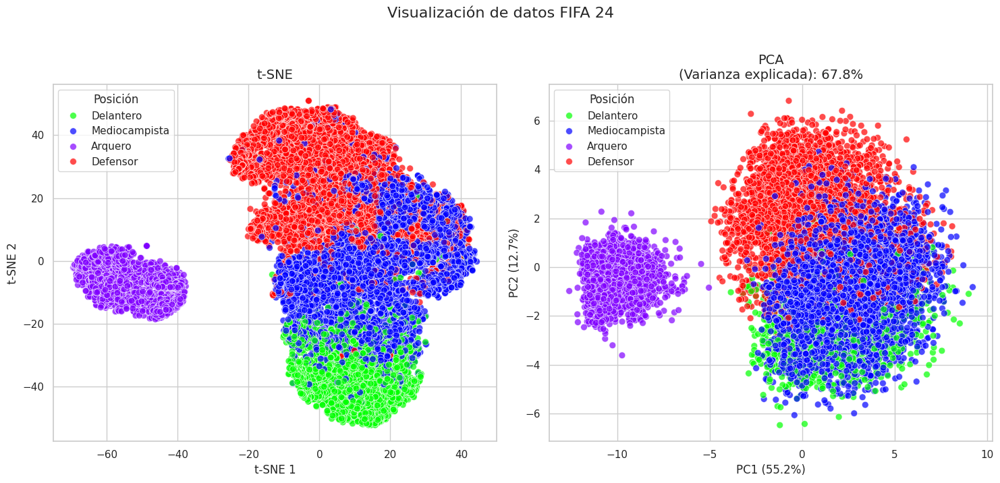

In [ ]:
plt.figure(figsize=(15, 7))

plt.subplot(1, 2, 1)
tsne_24 = TSNE(n_components=2, random_state=42, perplexity=100).fit_transform(data_24)
sns.scatterplot(x=tsne_24[:, 0], y=tsne_24[:, 1], hue=pos_24, palette=palette_4colors, alpha=0.7, s=50)
plt.title('t-SNE', fontsize=14)
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(title='Posición')

plt.subplot(1, 2, 2)
pca = PCA(n_components=2).fit(data_24)
pca_24 = pca.transform(data_24)
sns.scatterplot(x=pca_24[:, 0], y=pca_24[:, 1], hue=pos_24, palette=palette_4colors, alpha=0.7, s=50)
plt.title(f'PCA\n(Varianza explicada): {pca.explained_variance_ratio_.sum()*100:.1f}%', fontsize=14)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
#plt.legend(title='Posición')

plt.suptitle('Visualización de datos FIFA 24', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

Estas visualizaciones nos permiten confirmar que efectivamente la posición "Arquero" se separa mucho de las posiciones restantes. En base a esto, se decidió eliminar esta clase y trabajar en el problema de clasificación de 3 clases : "Defensor", "Mediocampista" y "Delantero".

Ademas se opta por eliminar las características que son propias de los Arqueros, ya que en el contexto de jugadores de cancha, estas no tienen sentido. Analizando sus distribuciones puede verse que las mismas son suficientes para diferenciar a los Arqueros, pero no para diferenciar entre el resto de posiciones.

Cabe notar que esta elección tambien permite obtener una nueva visualización en 2 dimensiones dada por el algoritmo de *Linear Discriminant Analysis*.

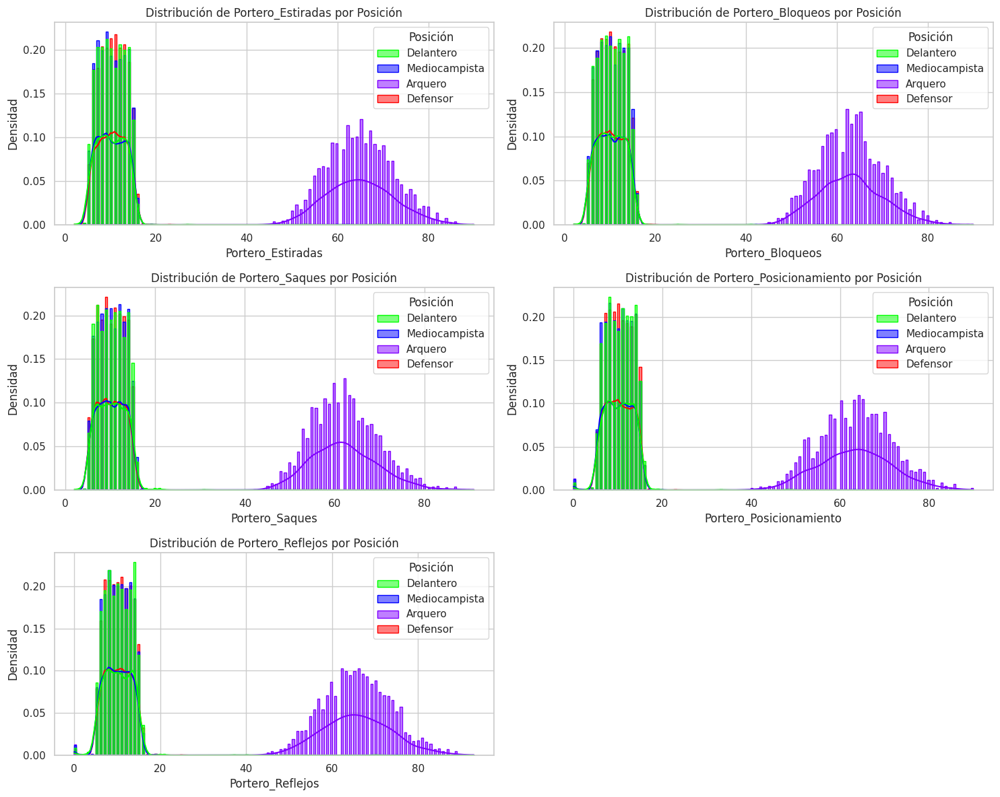

In [ ]:
arquero_cols = ['Portero_Estiradas', 'Portero_Bloqueos', 'Portero_Saques', 'Portero_Posicionamiento', 'Portero_Reflejos']

sns.set(style="whitegrid")
plt.figure(figsize=(15, 12))

for i, col in enumerate(arquero_cols, 1):
    plt.subplot(len(arquero_cols)//2 + 1, 2, i)

    sns.histplot(data=df_24,
                 x=col,
                 hue='Posición',
                 element='step',
                 stat='density',
                 common_norm=False,
                 kde=True,
                 palette=palette_4colors,
                 alpha=0.5)

    plt.title(f'Distribución de {col} por Posición')
    plt.xlabel(col)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [ ]:
#Se eliminan a los Arqueros y sus atributos

df_24 = df_24[df_24['Posición'] != 'Arquero'].reset_index(drop=True)
df_25 = df_25[df_25['Posición'] != 'Arquero'].reset_index(drop=True)

df_24 = df_24.drop(columns = arquero_cols)
df_24_multi = df_24_multi.drop(columns = arquero_cols)
df_25 = df_25.drop(columns = arquero_cols)

Volvemos a realizar las visualizaciones anteriores, pero esta vez viendo solo 3 posiciones.

In [ ]:
X = df_24.select_dtypes(include=[np.number])
pos_24 = df_24['Posición']

scaler = StandardScaler()
data_24 = scaler.fit_transform(X)

palette = {
    'Defensor': '#FF0000',    # Rojo
    'Mediocampista': '#0000FF', # Azul
    'Delantero': '#00FF00',    # Verde
}

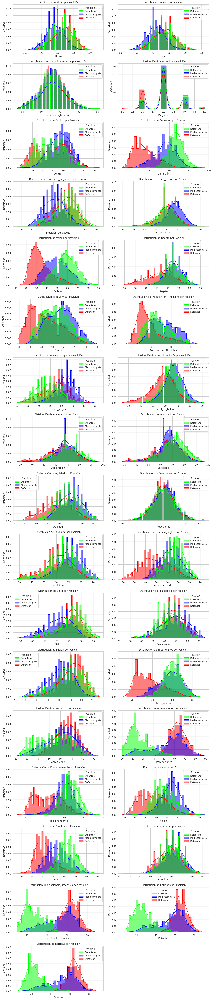

In [ ]:
plt.figure(figsize=(15, 70))
numeric_cols = df_24.select_dtypes(include=[np.number]).columns

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols)//2 + 1, 2, i)

    sns.histplot(data=df_24,
                 x=col,
                 hue='Posición',
                 element='step',
                 stat='density',
                 common_norm=False,
                 kde=True,
                 palette=palette,
                 alpha=0.5)

    plt.title(f'Distribución de {col} por Posición')
    plt.xlabel(col)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

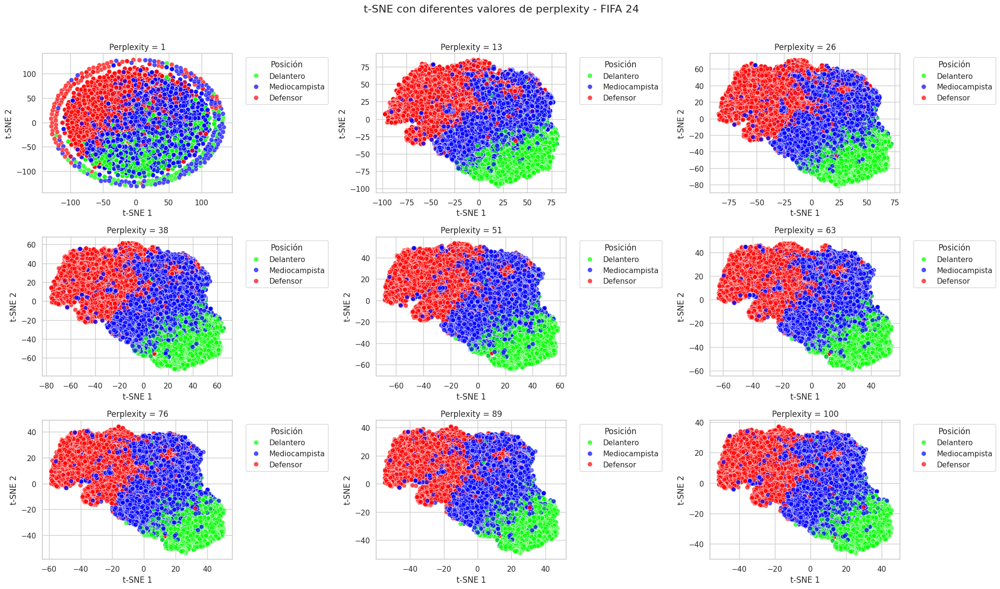

In [ ]:
'''
fig, axes = plt.subplots(3, 3, figsize=(21, 12))
fig.suptitle('t-SNE con diferentes valores de perplexity - FIFA 24', fontsize=16, y=1.02)

axes = axes.ravel()

for i, perplexity in enumerate(perplexities):

    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    tsne_results = tsne.fit_transform(data_24)

    sns.scatterplot(
        x=tsne_results[:, 0],
        y=tsne_results[:, 1],
        hue=pos_24,
        palette=palette,
        alpha=0.7,
        s=50,
        ax=axes[i]
    )

    axes[i].set_title(f'Perplexity = {perplexity}', fontsize=12)
    axes[i].set_xlabel('t-SNE 1')
    axes[i].set_ylabel('t-SNE 2')
    axes[i].legend(title='Posición', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()
'''

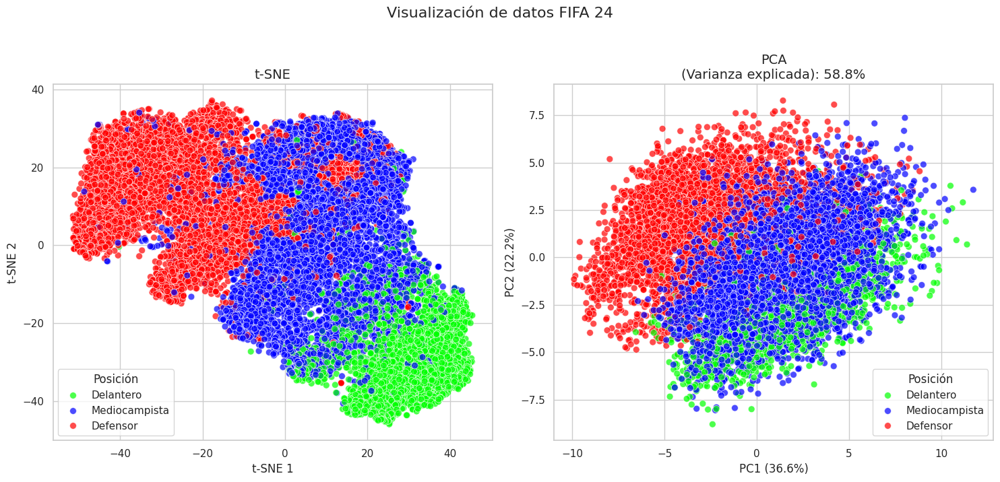

In [ ]:
plt.figure(figsize=(15, 7))

plt.subplot(1, 2, 1)
tsne_24 = TSNE(n_components=2, random_state=42, perplexity=100).fit_transform(data_24)
sns.scatterplot(x=tsne_24[:, 0], y=tsne_24[:, 1], hue=pos_24, palette=palette, alpha=0.7, s=50)
plt.title('t-SNE', fontsize=14)
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(title='Posición')

plt.subplot(1, 2, 2)
pca = PCA(n_components=2).fit(data_24)
pca_24 = pca.transform(data_24)
sns.scatterplot(x=pca_24[:, 0], y=pca_24[:, 1], hue=pos_24, palette=palette, alpha=0.7, s=50)
plt.title(f'PCA\n(Varianza explicada): {pca.explained_variance_ratio_.sum()*100:.1f}%', fontsize=14)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
#plt.legend(title='Posición')

plt.suptitle('Visualización de datos FIFA 24', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

Analizando estas visualizaciones puede verse una clara diferenciación entre los Defensores y los Delanteros. Sin embargo, aunque claramente tienen un agrupamiento visible, los mediocampistas tienden a mezclarse con las 2 posiciones restantes. Esto es algo esperable, ya que los mediocampistas, en caso de ser necesario, toman el rol de defensor o atacante.

Esto obliga a pensar un nuevo criterio para evaluar los modelos de clasificación, ya que, debido al solapamiento en los bordes de cada clase, es muy facil confundir a los mediocampistas con otras posiciones. Será necesario pedirle a los modelos, no solo que identifique correctamente la mayor cantidad posible de posiciones, sino que sepa reconocer lo mejor posible a los mediocampistas y no los confunda con defensores o delanteros.

Defino entonces una nueva métrica, a la que llamo "Precision Mediocampista" (o simplemente "Precision", aunque no es la misma que la que viene implentada para clasificación binaria), y viene dada por la fórmula:   
    
<br>
<br>

$$ \text{Precisión Mediocampista} = \frac{\text{Verdaderos Mediocampistas}}{\text{Verdaderos Mediocampistas} + \text{Falsos Defensores (M)} + \text{Falsos Delanteros(M)}}
$$
<br>
<br>

Donde los *Falsos Defensores(M)* y *Falsos Delanteros(M)* cuentan la cantidad de mediocampistas que fueron clasificados erróneamente como defensores o delanteros( de ahí la notación *(M)* ). Esta métrica permite contar la cantidad de mediocampistas que son reconocidos correctamente, por lo que se busca que sea lo mas próxima a 1 posible. Con esto vamos a poder medir que tan bien reconoce el modelo a los mediocampistas exclusivamente.

Esta medida, junto con el accuracy serán las métricas que se analizaran para evaluar los modelos. Además se medirá el tiempo que tarda cada modelo en entrenarse para tener una idea del costo computacional que conlleva cada alternativa.

In [ ]:
def precision_mediocampista(y_true, y_pred, mediocampista_label=1):

    cm = confusion_matrix(y_true, y_pred)

    true_mediocampistas = cm[mediocampista_label, mediocampista_label]
    false_defensores = cm[mediocampista_label, 0]  # Mediocampistas clasificados como defensores
    false_delanteros = cm[mediocampista_label, 2]   # Mediocampistas clasificados como delanteros

    denominador = true_mediocampistas + false_defensores + false_delanteros

    return true_mediocampistas / denominador

Teniendo en cuenta que se tiene una sola variable categórica, *Pie Preferido*, con solo 2 valores únicos, se le aplica codificación correspondiente para todos los set de datos.

In [ ]:
df_dummies_24 = pd.get_dummies(df_24['Pie_preferido'], prefix='Pie', dtype = int, drop_first=True)
df_dummies_24_multi = pd.get_dummies(df_24_multi['Pie_preferido'], prefix='Pie', dtype = int, drop_first=True)
df_dummies_25 = pd.get_dummies(df_25['Pie_preferido'], prefix='Pie', dtype = int, drop_first=True)

df_dummies_24 = df_dummies_24.rename(columns={'Pie_Right': 'Pie_Preferido'})
df_dummies_24_multi = df_dummies_24_multi.rename(columns={'Pie_Right': 'Pie_Preferido'})
df_dummies_25 = df_dummies_25.rename(columns={'Pie_Right': 'Pie_Preferido'})

In [ ]:
df_24 = df_24.drop(columns=['Pie_preferido'])
df_24_multi = df_24_multi.drop(columns=['Pie_preferido'])
df_25 = df_25.drop(columns=['Pie_preferido'])

Aunque se trate de una sola columna, se las conservarán como un dataframe aparte, ya que el resto de características requieren un tratamieno diferente para su preprocesamiento. Cuando sean utilizadas para entrenar los modelos, se las concatenará para formar un único DataFrame.

Defino los modelos que serán analizados:

*  *Naive Bayes* :  Un modelo simple y rápido que puede tomarse como baseline.

*  *Linear Discriminant Analysis* : Al igual que el anterior, es rápido y simple, y en este caso permite obtener una visualizacion extra de los datos.

*  *Logistic Regression* : Un modelo lineal del que se puede extraer interpretabilidad, analizando sus coeficientes.

*  *Perceptron* : Otro model lineal para comparar.

*  *K-Nearest Neighbors* : Un modelo no paramétrico, que tiene su justificación en el hecho de que jugadores con características similiares, puedan jugar en la misma posición.

*  *Random Forest*: Por último un ensamble de árboles que tiene la ventaja, no solo de funcionar bien, sino de que puede extraerse las importancias de las características de cada arbol y obtener una importancia promedio, que puede ser robusta que los coeficientes de la Regresion Logística.

In [ ]:
models = {
    'Naive Bayes': GaussianNB,
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis,
    'Logistic Regression': LogisticRegression,
    'Perceptron': Perceptron,
    'K-Nearest Neighbors': KNeighborsClassifier,
    'Random Forest': RandomForestClassifier,
}

#Codificación de la variable objetivo
y_24 = df_24['Posición'].replace({'Defensor': 0,
                               'Mediocampista': 1,
                               'Delantero': 2})
y_25 = df_25['Posición'].replace({'Defensor': 0,
                               'Mediocampista': 1,
                               'Delantero': 2})

Antes de empezar, se analizan las correlaciones entre las características.

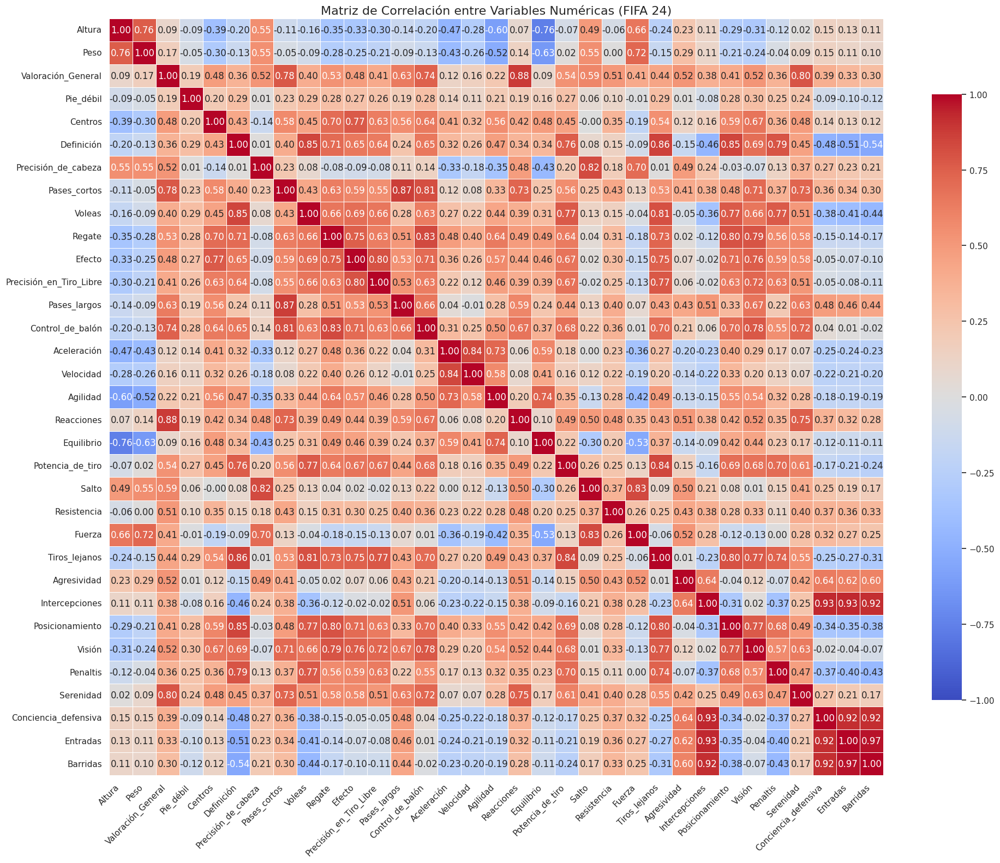

In [ ]:
sns.set(style="white")
plt.figure(figsize=(20, 16))

numeric_cols = df_24.select_dtypes(include=[np.number]).columns
corr_data = df_24[numeric_cols].dropna()

corr_matrix = corr_data.corr()

heatmap = sns.heatmap(corr_matrix,
                      cmap="coolwarm",
                      vmin=-1, vmax=1,
                      annot=True,
                      fmt=".2f",
                      linewidths=0.5,
                      cbar_kws={"shrink": 0.8})

plt.title("Matriz de Correlación entre Variables Numéricas (FIFA 24)", fontsize=16)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)

plt.tight_layout()
plt.show()

Dado que existen variables altamente correlacionadas, y debido al tamaño del set de datos, puede optarse por analizar que ocurre si se elige reducir la dimensionalidad. Existen 2 opciones:

1.   Reducción por Correlación : Identificar los grupos de variables altamente correlacionadas y quedarse con una, que represente a todo el grupo.
Esto se puede plantear como un problema de Clustering y permite conservar características que luego pueden ser interpretables.

2.   Reducción por PCA : Buscar y elegir el número de componentes principales adecuado, no solo que conserve la mayor varianza posible, sino que dé un rendimiento lo más alto posible. La desventaja es que haciendo esto, no se conservan las características originales y por lo tanto no se las puede interpretar viendo sus importancias.

Para tomar una desicion mas objetiva se realizarn pruebas de ambos caminos y se lo compararon con el rendimiento utilizando el set de datos completo (aprovechando que tampoco tiene un número muy grande de características).

Primero se buscaron los grupos de variables altamente correlacionadas.


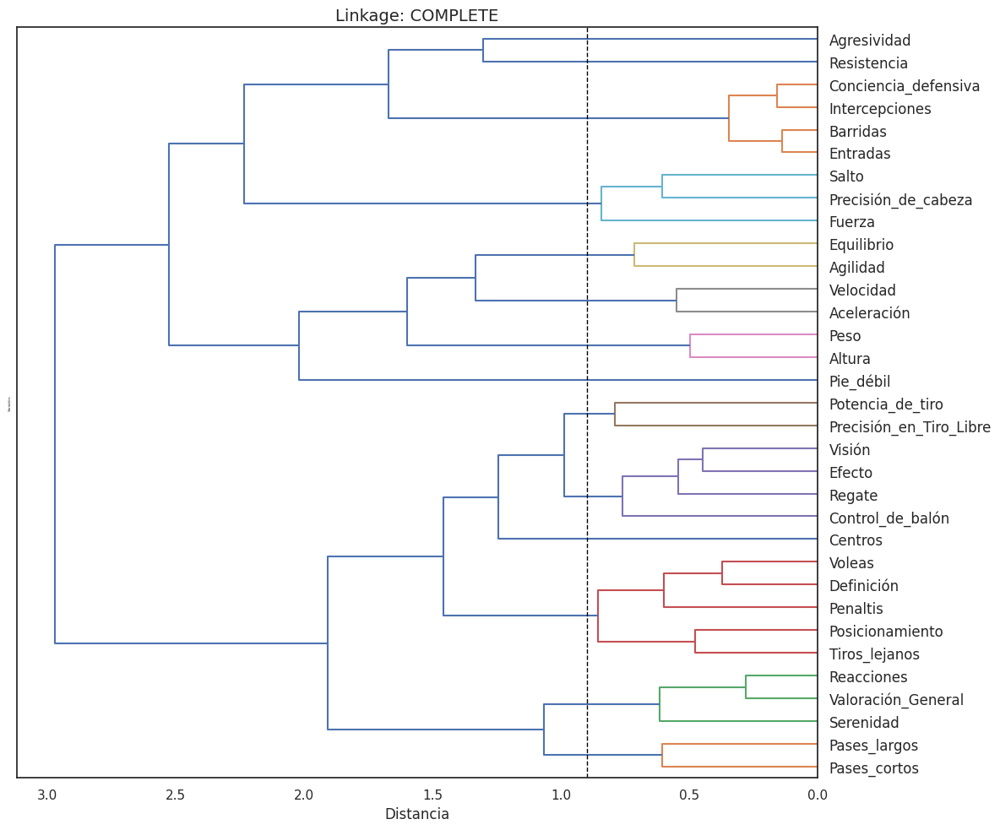

In [ ]:
#Defino una matriz de distancia para usarlo en Clustering Aglomerativo.
#Lo defino como la correlacion, en valor absoluto, menos 1.
#(Cuanto mas correlacionadas estén 2 variables, mas cerca estarán)
distance_matrix = 1 - np.abs(corr_matrix)

method = 'complete'

Z = hierarchy.linkage(distance_matrix,
                      method=method)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 10))

hierarchy.dendrogram(Z,
                     labels=corr_matrix.columns,
                     orientation='left',
                     leaf_font_size=12,
                     color_threshold=0.3 * max(Z[:, 2]),
                     ax=axes,
                     p=30)

for line in axes.get_lines():
    line.set_linewidth(100)

axes.set_title(f'Linkage: {method.upper()}', fontsize=14)
axes.axvline(x=0.9, color='black', linestyle='--', linewidth=1)
axes.set_xlabel('Distancia')
axes.set_ylabel('Variables', fontsize=3)

plt.tight_layout()
plt.show()

Haciendo un análisis visual del dendograma y con el criterio de conservar al menos la mitad de variables (para reducir a la mitad el set de datos) se eligió buscar 14 clusters de variables.

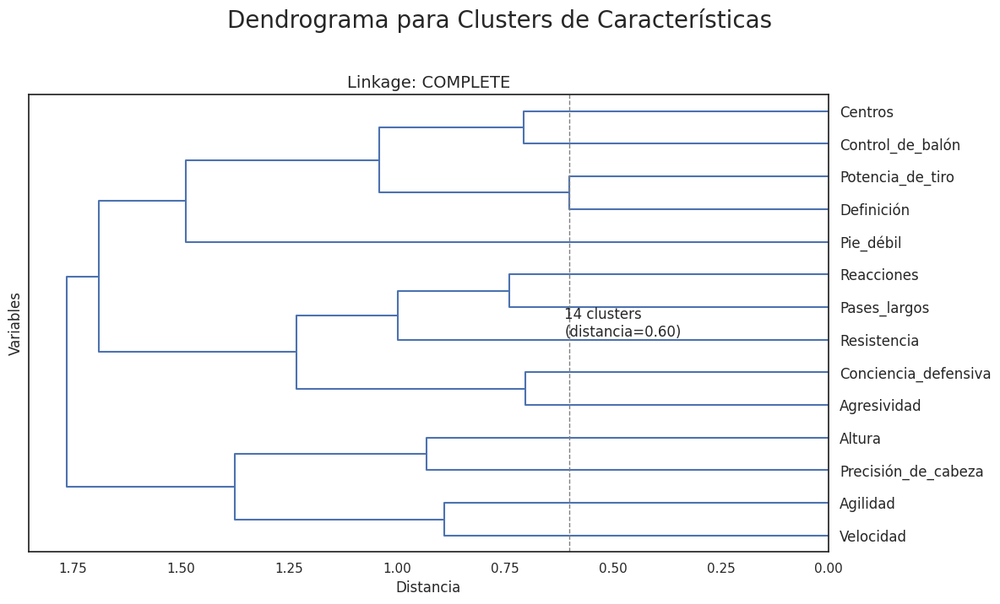

In [ ]:
# Calcular la distancia de corte para 14 clusters
from scipy.cluster.hierarchy import fcluster
max_clusters = 14
cut_distance = np.sort(Z[:, 2])[-max_clusters + 1]

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 7))
plt.suptitle("Dendrograma para Clusters de Características", fontsize=20, y=1.02)

hierarchy.dendrogram(Z,
                    labels=corr_matrix.columns,
                    orientation='left',
                    leaf_font_size=12,
                    color_threshold=cut_distance,  # Usamos el umbral calculado
                    ax=axes)

# Añadir línea vertical punteada
axes.axvline(x=cut_distance, color='gray', linestyle='--', linewidth=1)
axes.text(cut_distance + 0.01, 0.5, f'14 clusters\n(distancia={cut_distance:.2f})',
         transform=axes.get_xaxis_transform(), va='center')

axes.set_title(f'Linkage: {method.upper()}', fontsize=14)
axes.set_xlabel('Distancia')
axes.set_ylabel('Variables')

plt.tight_layout()
plt.show()

In [ ]:
n_clusters = 14
cluster_model = AgglomerativeClustering(
    n_clusters=n_clusters,
    linkage='complete'
)
clusters = cluster_model.fit_predict(distance_matrix)

feature_groups = {}
for i in range(n_clusters):
    group_features = corr_matrix.columns[clusters == i].tolist()
    feature_groups[f"Cluster_{i+1}"] = group_features

for group, features in feature_groups.items():
    print(f"{group} ({len(features)} Características): {features}")

Cluster_1 (5 Características): ['Definición', 'Voleas', 'Tiros_lejanos', 'Posicionamiento', 'Penaltis']
Cluster_2 (3 Características): ['Precisión_de_cabeza', 'Salto', 'Fuerza']
Cluster_3 (4 Características): ['Regate', 'Efecto', 'Control_de_balón', 'Visión']
Cluster_4 (2 Características): ['Precisión_en_Tiro_Libre', 'Potencia_de_tiro']
Cluster_5 (2 Características): ['Aceleración', 'Velocidad']
Cluster_6 (2 Características): ['Pases_cortos', 'Pases_largos']
Cluster_7 (3 Características): ['Valoración_General', 'Reacciones', 'Serenidad']
Cluster_8 (2 Características): ['Altura', 'Peso']
Cluster_9 (2 Características): ['Agilidad', 'Equilibrio']
Cluster_10 (1 Características): ['Pie_débil']
Cluster_11 (1 Características): ['Resistencia']
Cluster_12 (1 Características): ['Centros']
Cluster_13 (1 Características): ['Agresividad']
Cluster_14 (4 Características): ['Intercepciones', 'Conciencia_defensiva', 'Entradas', 'Barridas']


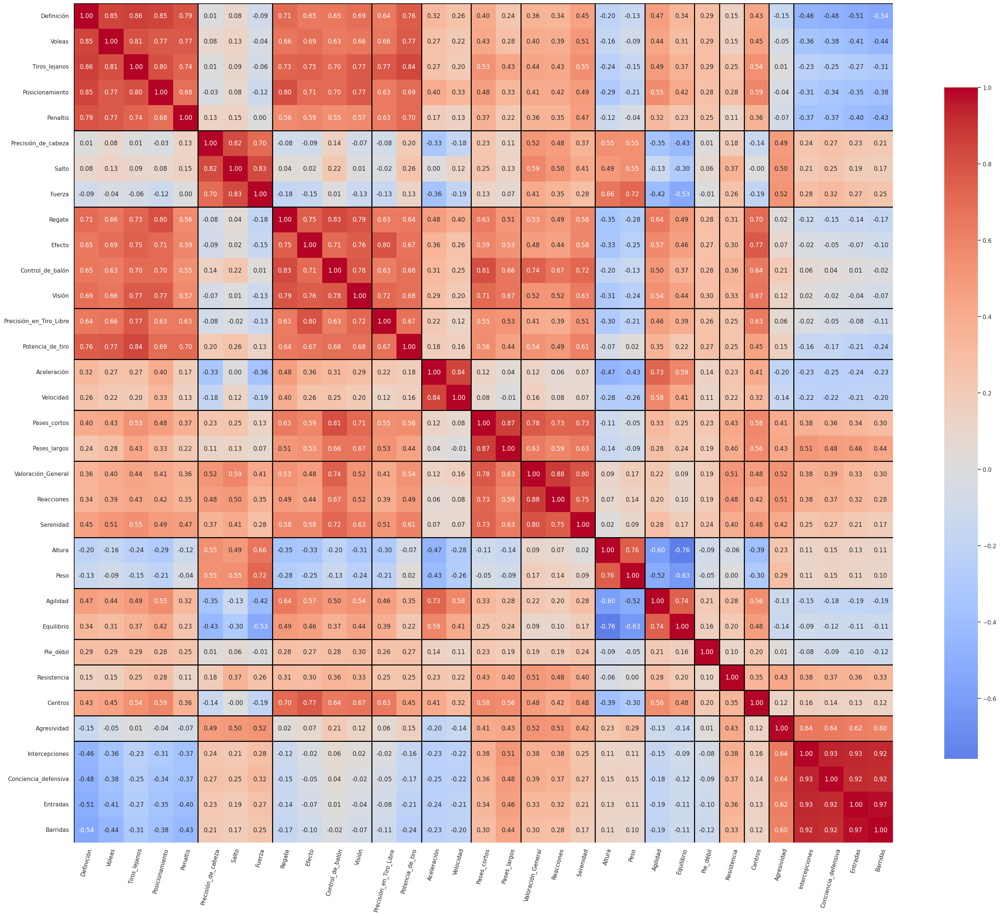

In [ ]:
Z = hierarchy.linkage(distance_matrix, method='complete')

dendro_order = hierarchy.leaves_list(Z)
ordered_features = corr_matrix.columns[dendro_order]

cluster_ordered_features = []
for i in range(1, n_clusters+1):
    cluster_ordered_features.extend(feature_groups[f"Cluster_{i}"])

reordered_corr = corr_matrix.loc[cluster_ordered_features, cluster_ordered_features]

plt.figure(figsize=(30, 25))
ax = sns.heatmap(
    reordered_corr,
    cmap='coolwarm',
    center=0,
    annot=True,
    xticklabels=True,
    yticklabels=True,
    cbar_kws={'shrink': 0.8},
    fmt=".2f"
)

current_pos = 0
for i in range(1, n_clusters + 1):
    cluster_size = len(feature_groups[f"Cluster_{i}"])
    ax.axhline(current_pos, color='black', lw=2)
    ax.axvline(current_pos, color='black', lw=2)
    current_pos += cluster_size

current_pos = 0
for i in range(1, n_clusters+1):
    cluster_size = len(feature_groups[f"Cluster_{i}"])
    middle_pos = current_pos + cluster_size / 2
    current_pos += cluster_size

plt.xticks(rotation=75)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Viendo los cuadrados diagonales, puede comprobarse que los clusters encontrados tienen una correlación alta entre variables internas.

Luego se eligió una sola variable dentro de cada uno, para conseguir un set de datos reducido. Se eligió la característica que en caso de evaluar su importancia, pueda llegar a describir mejor a un jugador, o diferenciar una posicion de la otra, sin embargo esta elección es subjetiva y puede considerarse otras combinaciones.

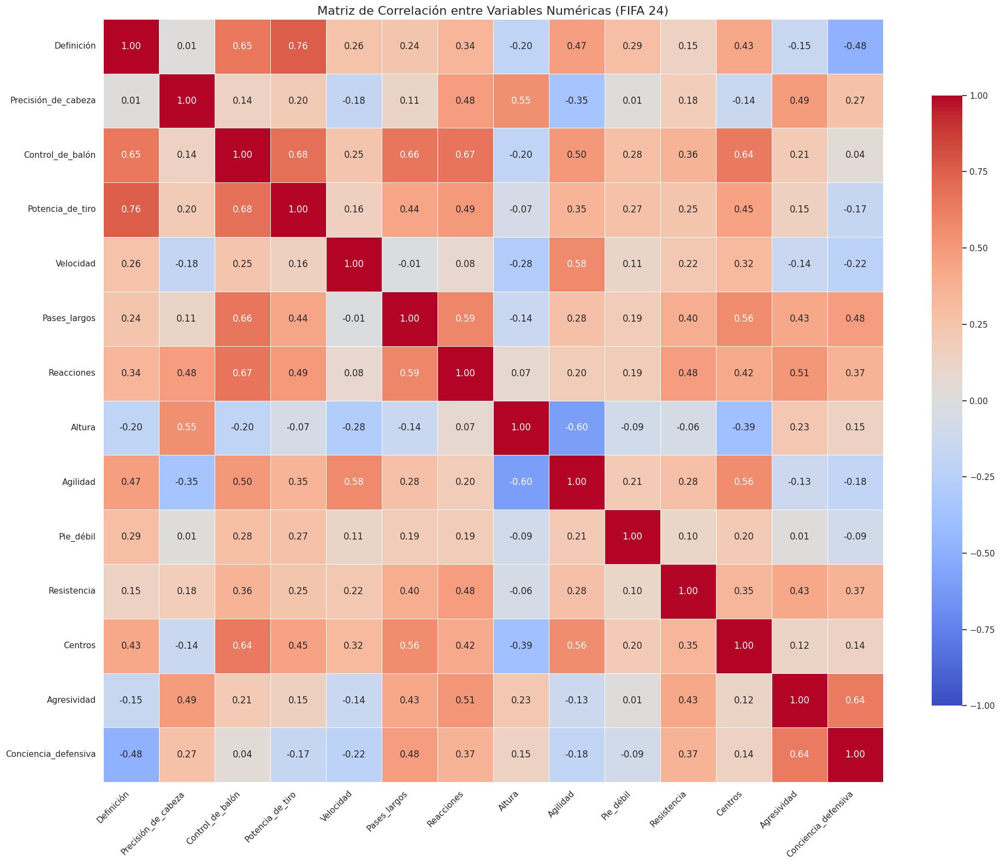

In [ ]:
columns_selected = ['Definición', 'Precisión_de_cabeza', 'Control_de_balón',
                    'Potencia_de_tiro', 'Velocidad', 'Pases_largos', 'Reacciones',
                    'Altura', 'Agilidad', 'Pie_débil', 'Resistencia', 'Centros',
                    'Agresividad', 'Conciencia_defensiva']

sns.set(style="white")
plt.figure(figsize=(20, 16))

corr_data = df_24[columns_selected]

corr_matrix = corr_data.corr()

heatmap = sns.heatmap(corr_matrix,
                      cmap="coolwarm",
                      vmin=-1, vmax=1,
                      annot=True,
                      fmt=".2f",
                      linewidths=0.5,
                      cbar_kws={"shrink": 0.8})

plt.title("Matriz de Correlación entre Variables Numéricas (FIFA 24)", fontsize=16)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)

plt.tight_layout()
plt.show()

Viendo la matriz de correlación resultante, efectivamente se eliminaron casi todas las correlaciones altas y se logro reducir el tamaño de set de datos.

Resta entrenar los modelos con los 2 set de datos(el original y el reducido por correlación), haciendo una validación cruzada para obtener valores de métricas mas robustos y representativos, y que además puedan compararse mediante pruebas estadísticas.

In [ ]:
columns_drop = list(set(df_24.columns) - set(columns_selected + ['Posición']))

columns_to_drop = {
    'Todas las\nCaracterísticas': [],
    'Características Filtradas\npor Correlación': columns_drop
}

Para la Validación Cruzada se dividio cada set de datos en 9 pliegues (8 para entrenamiento y 1 de prueba en cada iteracion), teniendo en cuenta la proporción de muestras de cada clase, ya que el set de datos se encuentra desvalanceado.

Ademas se definieron diccionarios donde se irán guardando las métricas obtenidas (las listas de métricas para cada pliegue y los valores promedios, esto para cada set de datos y para cada modelo). En total se crean 3 diccionarios para cada no, uno para los accuracies, otro para la presicion mediocampista y otro para los tiempos de entrenamiento.

In [ ]:
skf = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)

# Diccionario de Valores medios de Métricas
results = {}
times = {}
prec_med = {}

#Diccionario para guardar listas de métricas en cada pliegue.
accu_values = {name: {} for name in models.keys()}
prec_values = {name: {} for name in models.keys()}
times_values = {name: {} for name in models.keys()}

In [ ]:
#Entrenamiento de cada modelo, sobre cada set de datos (original y reducido por Correlación),
# y guardado de métricas.

for columns_names, columns in columns_to_drop.items():

    X = df_24.drop(columns=columns + ['Posición'])

    print(f"{columns_names} ({len(X.columns) + 1} columnas)\n")

    results[f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []
    times[f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []
    prec_med[f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []

    for name in models.keys():
        accu_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []
        times_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []
        prec_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = []

    for name, model in models.items():

        print(f"Modelo: {name}")

        accuracys = []
        t = []
        precisiones = []

        for train_idx, test_idx in skf.split(X, y_24):

            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            X_train_dummies, X_test_dummies = df_dummies_24.iloc[train_idx], df_dummies_24.iloc[test_idx]
            y_train, y_test = y_24.iloc[train_idx], y_24.iloc[test_idx]

            # Cuando se use el modelo de KNN, en lugar de estandarizar los datos, escalan
            # por ser un método basado en distancias.
            if name == 'K-Nearest Neighbors':
                scaler = MinMaxScaler()
            else:
                scaler = StandardScaler()

            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)

            X_train = pd.DataFrame(X_train_scaled, columns = X.columns, index = train_idx)
            X_test = pd.DataFrame(X_test_scaled, columns = X.columns, index = test_idx)

            X_train = pd.concat([X_train,
                                 X_train_dummies], axis = 1)
            X_test = pd.concat([X_test,
                                X_test_dummies], axis = 1)

            modelo = model()

            start_time = time.time()
            modelo.fit(X_train, y_train)
            final_time = time.time()
            y_pred = modelo.predict(X_test)

            accu = accuracy_score(y_test, y_pred)
            prec = precision_mediocampista(y_test, y_pred)

            accuracys.append(accu)
            t.append(final_time - start_time)
            precisiones.append(prec)

        results[f"{columns_names}\n({len(X.columns) + 1} columnas)"].append(np.mean(accuracys))
        times[f"{columns_names}\n({len(X.columns) + 1} columnas)"].append(np.mean(t))
        prec_med[f"{columns_names}\n({len(X.columns) + 1} columnas)"].append(np.mean(precisiones))

        accu_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = accuracys
        times_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = t
        prec_values[name][f"{columns_names}\n({len(X.columns) + 1} columnas)"] = precisiones

    print()

df_results = pd.DataFrame(results, index=models.keys())
df_results.index.name = 'Modelo'
df_times = pd.DataFrame(times, index=models.keys())
df_times.index.name = 'Modelo'
df_prec = pd.DataFrame(prec_med, index=models.keys())
df_prec.index.name = 'Modelo'

Todas las
Características (34 columnas)

Modelo: Naive Bayes
Modelo: Linear Discriminant Analysis
Modelo: Logistic Regression
Modelo: Perceptron
Modelo: K-Nearest Neighbors
Modelo: Random Forest

Características Filtradas
por Correlación (15 columnas)

Modelo: Naive Bayes
Modelo: Linear Discriminant Analysis
Modelo: Logistic Regression
Modelo: Perceptron
Modelo: K-Nearest Neighbors
Modelo: Random Forest



In [ ]:
# Guardo en un DataFrame distinto el set de datos reducido por Correlación.
df_24_selec = df_24.drop(columns = columns_to_drop['Características Filtradas\npor Correlación'])
df_24_selec

,Altura,Posición,Pie_débil,Centros,Definición,Precisión_de_cabeza,Pases_largos,Control_de_balón,Velocidad,Agilidad,Reacciones,Potencia_de_tiro,Resistencia,Agresividad,Conciencia_defensiva
0,195,Delantero,3,47,96,83,63,82,94,78,94,94,76,87,38
1,182,Delantero,4,78,94,73,71,92,97,93,93,90,88,64,26
2,181,Mediocampista,5,95,85,55,94,92,74,76,92,92,88,75,66
3,191,Mediocampista,4,71,70,81,90,88,65,65,93,92,89,85,92
4,188,Delantero,5,80,95,89,88,87,71,66,93,93,81,80,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12402,180,Defensor,3,24,24,43,21,28,56,55,45,35,39,43,51
12403,172,Mediocampista,3,37,40,40,40,50,54,60,43,41,37,40,29
12404,177,Mediocampista,3,37,26,40,51,45,66,58,45,48,56,51,33
12405,182,Mediocampista,3,35,31,42,50,42,60,57,45,40,49,56,40


Luego se realizó la reducción de dimensionalidad por PCA.

Primero se analizó la proporción de varianza capturada por cada conjunto de componentes principales.

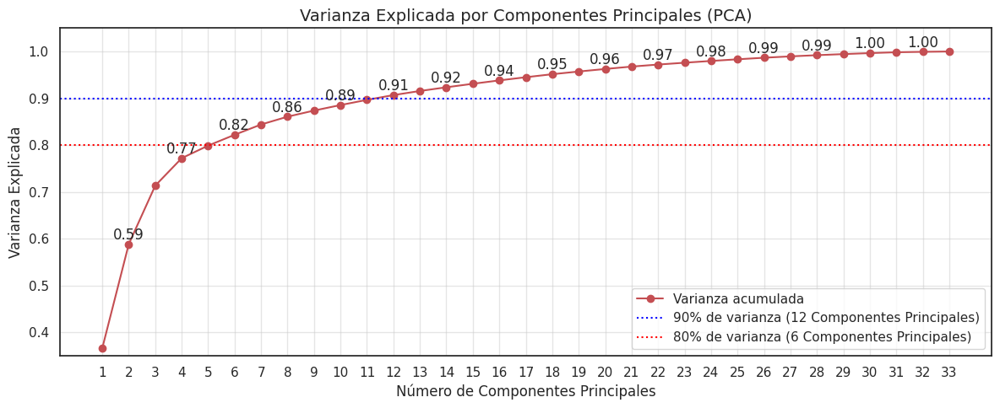

In [ ]:
numeric_data = df_24.select_dtypes(include=[np.number])
X_scaled = StandardScaler().fit_transform(numeric_data)

pca = PCA().fit(X_scaled)

cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(12, 5))

line = plt.plot(range(1, len(cumulative_variance) + 1),
                cumulative_variance,
                'ro-',
                label='Varianza acumulada')

for i, (v, cv) in enumerate(zip(pca.explained_variance_ratio_, cumulative_variance)):
    if i % 2 == 1:
        plt.text(i + 1, cv + 0.01, f"{cv:.2f}", ha='center')

plt.axhline(y=0.9, color='blue', linestyle=':', label=f'90% de varianza ({(cumulative_variance >= 0.9).argmax() + 1} Componentes Principales)')
plt.axhline(y=0.8, color='red', linestyle=':', label=f'80% de varianza ({(cumulative_variance >= 0.8).argmax() + 1} Componentes Principales)')

plt.xlabel('Número de Componentes Principales', fontsize=12)
plt.ylabel('Varianza Explicada', fontsize=12)
plt.title('Varianza Explicada por Componentes Principales (PCA)', fontsize=14)
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.ylim(0.35, 1.05)
plt.grid(alpha=0.5)
plt.legend(loc='lower right', bbox_to_anchor=(1, 0))

plt.tight_layout()
plt.show()

Viendo que con 6 a 12 componentes principales conservo entre el 80% y el 90% de la varianza, puedo probar en valores dentro de este rango y ver cual es el más indicado(esto me evita el probar con todas las posibilidades de componentes principales).

In [ ]:
X = df_24.drop(columns=['Posición'])
numeric_cols = X.columns

scores_pca = {}
times_pca = {}
prec_med_pca = {}

pca_values = {name: {} for name in models.keys()}
times_pca_values = {name: {} for name in models.keys()}
prec_values_pca = {name: {} for name in models.keys()}

In [ ]:
for name, model in models.items():

    scores_pca[name] = []
    times_pca[name] = []
    prec_med_pca[name] = []

    print(f'Modelo: {name}')

    for i in range(6, 13):

        accuracys = []
        t = []
        precisiones = []

        print(f'Numero de Componentes: {i}')

        for train_idx, test_idx in skf.split(X, y_24):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            X_train_dummies, X_test_dummies = df_dummies_24.iloc[train_idx], df_dummies_24.iloc[test_idx]
            y_train, y_test = y_24.iloc[train_idx], y_24.iloc[test_idx]

            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)

            pca = PCA(n_components = i)
            X_train_pca = pca.fit_transform(X_train_scaled)
            X_test_pca = pca.transform(X_test_scaled)

            pca_columns = [f'PC_{i+1}' for i in range(pca.n_components_)]

            X_train_pca = pd.DataFrame(X_train_pca, columns=pca_columns, index=train_idx)
            X_test_pca = pd.DataFrame(X_test_pca, columns=pca_columns, index=test_idx)

            # Cuando se use el modelo de KNN, en lugar de estandarizar los datos, escalan
            # por ser un método basado en distancias.
            if name == 'K-Nearest Neighbors':
                norm = MinMaxScaler().fit(X_train_pca)
                X_train_pca = pd.DataFrame(norm.transform(X_train_pca), columns=pca_columns, index=train_idx)
                X_test_pca = pd.DataFrame(norm.transform(X_test_pca), columns=pca_columns, index=test_idx)

            X_train = pd.concat([
                X_train_pca,
                X_train_dummies
            ], axis=1)

            X_test = pd.concat([
                X_test_pca,
                X_test_dummies
            ], axis=1)

            modelo = model()

            start_time = time.time()
            modelo.fit(X_train, y_train)
            final_time = time.time()

            y_pred_24 = modelo.predict(X_test)
            accu = accuracy_score(y_test, y_pred_24)
            prec = precision_mediocampista(y_test, y_pred_24)

            accuracys.append(accu)
            precisiones.append(prec)
            t.append(time.time() - start_time)

        scores_pca[name].append(np.mean(accuracys))
        times_pca[name].append(np.mean(t))
        prec_med_pca[name].append(np.mean(precisiones))

        pca_values[name][i] = accuracys
        times_pca_values[name][i] = t
        prec_values_pca[name][i] = precisiones

    print()

Modelo: Naive Bayes
Numero de Componentes: 6
Numero de Componentes: 7
Numero de Componentes: 8
Numero de Componentes: 9
Numero de Componentes: 10
Numero de Componentes: 11
Numero de Componentes: 12

Modelo: Linear Discriminant Analysis
Numero de Componentes: 6
Numero de Componentes: 7
Numero de Componentes: 8
Numero de Componentes: 9
Numero de Componentes: 10
Numero de Componentes: 11
Numero de Componentes: 12

Modelo: Logistic Regression
Numero de Componentes: 6
Numero de Componentes: 7
Numero de Componentes: 8
Numero de Componentes: 9
Numero de Componentes: 10
Numero de Componentes: 11
Numero de Componentes: 12

Modelo: Perceptron
Numero de Componentes: 6
Numero de Componentes: 7
Numero de Componentes: 8
Numero de Componentes: 9
Numero de Componentes: 10
Numero de Componentes: 11
Numero de Componentes: 12

Modelo: K-Nearest Neighbors
Numero de Componentes: 6
Numero de Componentes: 7
Numero de Componentes: 8
Numero de Componentes: 9
Numero de Componentes: 10
Numero de Componentes: 11


In [ ]:
#Guardo en un Dataframe para poder manejarlos mas facilmente

times_pca = pd.DataFrame(times_pca, index=range(6, 13))
times_pca.index.name = 'Número de Componentes'
times_pca = times_pca.T

scores_pca = pd.DataFrame(scores_pca, index=range(6, 13))
scores_pca.index.name = 'Número de Componentes'
scores_pca = scores_pca.T

prec_med_pca = pd.DataFrame(prec_med_pca, index=range(6, 13))
prec_med_pca.index.name = 'Número de Componentes'
prec_med_pca = prec_med_pca.T

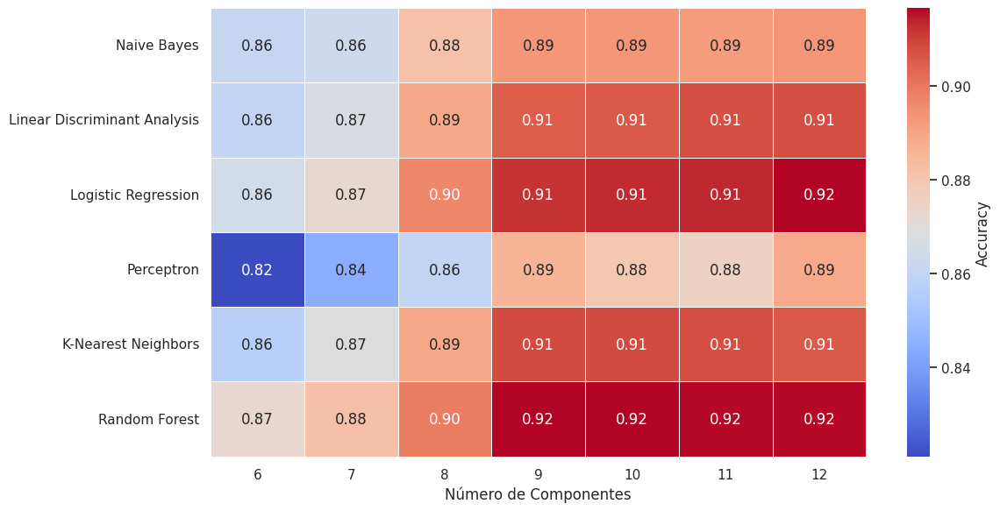

In [ ]:
#Visualizo los valores medios de Accuracy

plt.figure(figsize=(12, 6))
sns.heatmap(scores_pca,
            cmap="coolwarm",
            annot=True,
            fmt=".2f",
            linewidths=0.7,
            cbar_kws={"shrink": 1, "label": "Accuracy"})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.tight_layout()
plt.show()

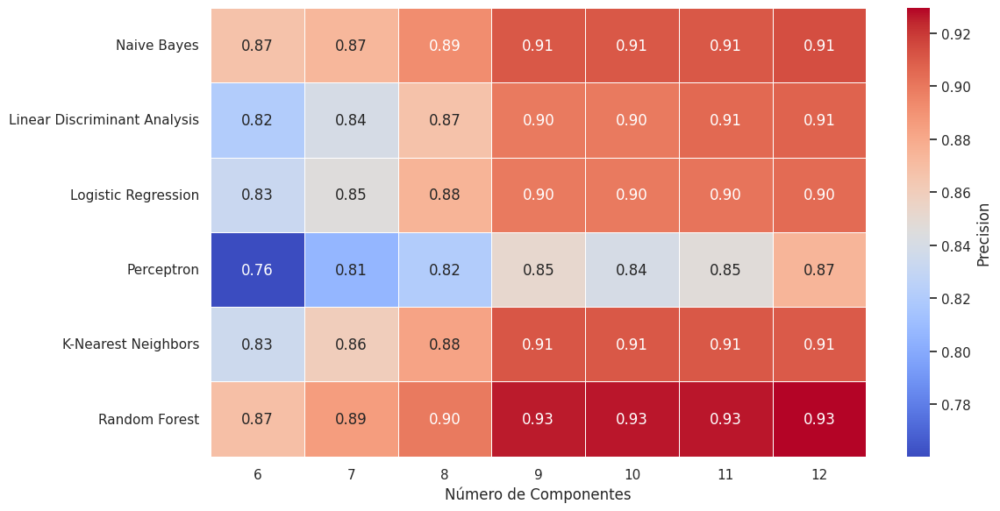

In [ ]:
#Visualizo los valores medios de Presicion mediocampista

plt.figure(figsize=(12, 6))
sns.heatmap(prec_med_pca,
            cmap="coolwarm",
            annot=True,
            fmt=".2f",
            linewidths=0.7,
            cbar_kws={"shrink": 1, "label": "Precision"})
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.tight_layout()
plt.show()

No basta con ver los valores medios, hay que analizar las distribuciones de valores de cada pliegue.

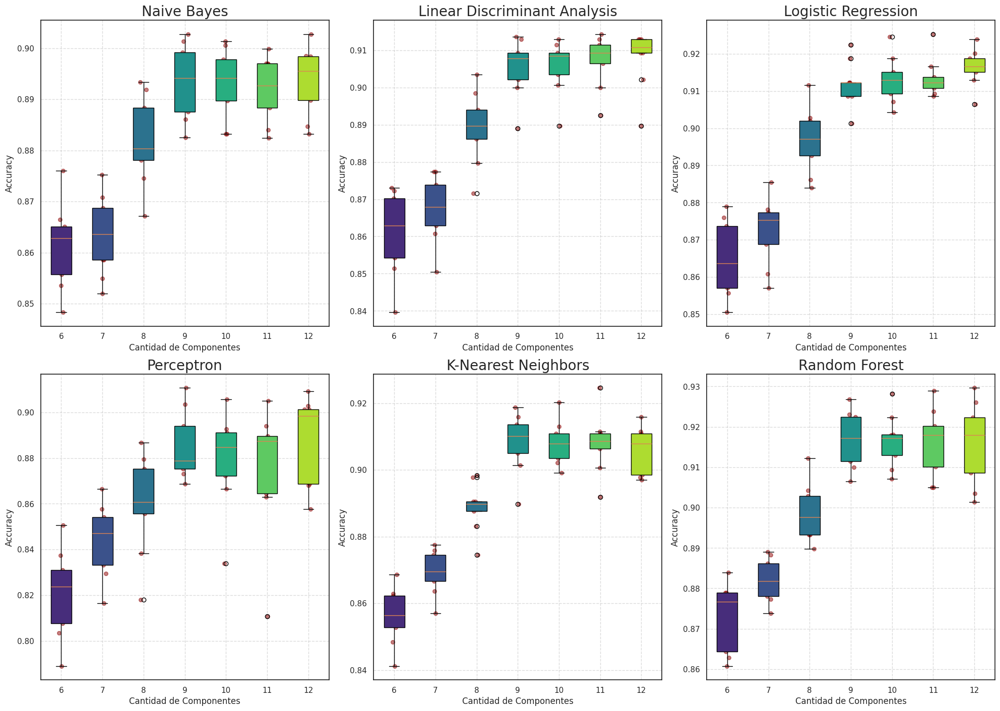

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))
axes = axes.flatten()

for i, (model_name, pca_dict) in enumerate(pca_values.items()):
    data_to_plot = []
    labels = []

    for componentes, accuracies in pca_dict.items():
        data_to_plot.append(accuracies)
        labels.append(f"{componentes}")

    bp = axes[i].boxplot(data_to_plot, patch_artist=True)

    colors = sns.color_palette("viridis", len(data_to_plot))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xticklabels(labels, rotation=0, ha='center')
    axes[i].set_ylabel('Accuracy', fontsize=12)
    axes[i].set_xlabel('Cantidad de Componentes', fontsize=12)
    axes[i].grid(True, linestyle='--', alpha=0.7)

    for j, acc in enumerate(data_to_plot):
        x = np.random.normal(j+1, 0.04, size=len(acc))
        axes[i].scatter(x, acc, alpha=0.5, color='darkred', s=30)

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

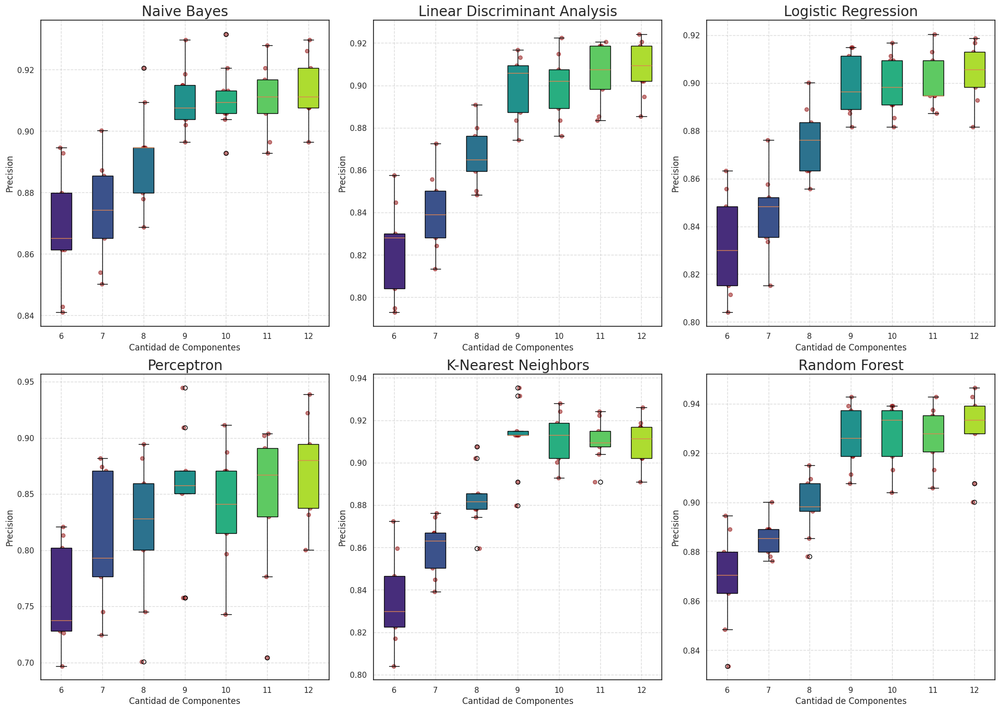

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))
axes = axes.flatten()

for i, (model_name, prec_dict) in enumerate(prec_values_pca.items()):
    data_to_plot = []
    labels = []

    for componentes, precision in prec_dict.items():
        data_to_plot.append(precision)
        labels.append(f"{componentes}")

    bp = axes[i].boxplot(data_to_plot, patch_artist=True)

    colors = sns.color_palette("viridis", len(data_to_plot))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xticklabels(labels, rotation=0, ha='center')
    axes[i].set_ylabel('Precision', fontsize=12)
    axes[i].set_xlabel('Cantidad de Componentes', fontsize=12)
    axes[i].grid(True, linestyle='--', alpha=0.7)

    for j, acc in enumerate(data_to_plot):
        x = np.random.normal(j+1, 0.04, size=len(acc))
        axes[i].scatter(x, acc, alpha=0.5, color='darkred', s=30)

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

Puede verse que las metricas van mejorando hasta llegar al uso de 9 componentes principales, donde parece que no hay una mejora significativa en el rendimiento de los modelos. Por ende, se opta por tomar 9 componentes principales para la reducción por PCA.

In [ ]:
# Se anexa en el Dataframe de resultados de Accuracy y Presicion los valores correspondientes
# al set de datos reducido por PCA de 9 componentes.

df_results['PCA\n(9 Columnas)'] = scores_pca[9]
df_results

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas)
Modelo,,,
Naive Bayes,0.824857,0.821230,0.893286
Linear Discriminant Analysis,0.911582,0.892560,0.905375
Logistic Regression,0.927782,0.906908,0.911985
Perceptron,0.894738,0.880390,0.885952
K-Nearest Neighbors,0.905375,0.899332,0.908196
Random Forest,0.927702,0.919401,0.916579


In [ ]:
df_prec['PCA\n(9 Columnas)'] = prec_med_pca[9]
df_prec

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas)
Modelo,,,
Naive Bayes,0.792565,0.821319,0.910454
Linear Discriminant Analysis,0.912918,0.877388,0.899363
Logistic Regression,0.918053,0.889916,0.899569
Perceptron,0.867940,0.835901,0.851920
K-Nearest Neighbors,0.904292,0.894434,0.911686
Random Forest,0.921134,0.918258,0.926063


In [ ]:
# De igual forma con el dataframe de tiempos de entrenamiento

df_times['PCA\n(9 Columnas)'] = times_pca[9]
df_times

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas)
Modelo,,,
Naive Bayes,0.010962,0.005597,0.012396
Linear Discriminant Analysis,0.048798,0.018677,0.056619
Logistic Regression,1.532938,0.240764,0.204794
Perceptron,0.047657,0.046805,0.043164
K-Nearest Neighbors,0.004386,0.029233,0.249367
Random Forest,2.922941,1.771339,4.441254


In [ ]:
# Tambien se guardan las listas de metricas de cada pliegue

accu_filtrado = {}
prec_filtrado = {}
times_filtrado = {}

for name in models.keys():

    accu_filtrado[name] = {}
    prec_filtrado[name] = {}
    times_filtrado[name] = {}

    for caracteristicas in ['Todas las\nCaracterísticas\n(34 columnas)', 'Características Filtradas\npor Correlación\n(15 columnas)']:

        accu_filtrado[name][caracteristicas] = accu_values[name][caracteristicas]
        prec_filtrado[name][caracteristicas] = prec_values[name][caracteristicas]
        times_filtrado[name][caracteristicas] = times_values[name][caracteristicas]

In [ ]:
for name in models.keys():
    accu_filtrado[name]['PCA\n(9 Columnas)'] = pca_values[name][9]
    prec_filtrado[name]['PCA\n(9 Columnas)'] = prec_values_pca[name][9]
    times_filtrado[name]['PCA\n(9 Columnas)'] = times_pca_values[name][9]

In [ ]:
# Guardo tambien el dataframe con los datos reducidos por PCA

scaler_pca = StandardScaler()
df_24_scaled = scaler_pca.fit_transform(df_24.drop(columns=['Posición']))

pca = PCA(n_components=9)
df_24_pca = pca.fit_transform(df_24_scaled)
pca_columns = [f'PC_{i+1}' for i in range(pca.n_components_)]

df_24_pca = pd.DataFrame(df_24_pca, columns=pca_columns)
df_24_pca = pd.concat([
    df_24_pca,
    df_24[['Posición']]
], axis=1)
df_24_pca

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,Posición
0,8.763938,3.062524,5.715297,2.965963,-0.885445,-0.485119,-0.097793,-0.293449,-1.136898,Delantero
1,11.390549,0.684224,2.408374,3.435168,0.531422,-1.260105,-0.164070,0.252157,0.496009,Delantero
2,11.731738,3.569392,0.074931,-0.989285,1.940166,0.094849,0.738903,0.337206,0.573264,Mediocampista
3,8.026279,7.366024,0.768693,-0.903675,0.853676,-0.468639,0.301719,0.718022,0.046373,Mediocampista
4,10.494321,3.779742,4.444958,-0.128969,2.024324,-0.665693,-0.479743,-0.032762,0.701926,Delantero
...,...,...,...,...,...,...,...,...,...,...
12402,-9.039011,-3.975658,-1.525083,-1.392295,0.833462,0.744491,-1.136178,-1.275843,-0.004263,Defensor
12403,-4.521481,-5.655871,-1.288497,-3.451051,0.498324,-0.782631,-0.141862,-0.262606,0.268341,Mediocampista
12404,-4.500982,-4.067308,-1.745261,-1.118485,0.538607,0.313928,-0.012499,0.448105,-1.123269,Mediocampista
12405,-6.105158,-3.036442,-0.981141,-2.115545,0.594679,0.476917,0.400103,0.069515,-0.811897,Mediocampista


Hasta el momento los resultados obtenidos fueron entrend y evaluando modelos con sus hiperparametros por Default. Ahora se procede a la búsqueda de mejores hiperparametros, mediante un GridSearch (Búsqueda por Grilla). Para esto se definen primero los diccionarios con hiperparametros a probar, teniendo estos dentro los valores por Default, en caso de que esta combinación resulte ser la mejor.

In [ ]:
nb_params = {
    'priors': [None, [1/3, 1/3, 1/3]]
}

lda_params = {
    "solver": ["svd", "lsqr", "eigen"],
    "shrinkage": [None, "auto"],
    "priors": [None, [1/3, 1/3, 1/3]],
}

knn_params = {
    "n_neighbors": [3, 5, 7, 9, 11, 15],
    "weights": ["uniform", "distance"],
    "metric": ["minkowski", "manhattan", "euclidean"],
    "algorithm": ["auto", "ball_tree", "brute"]
}

perc_params = {
    'penalty': [None, 'l2', 'l1', 'elasticnet'],
    'eta0': [0.01, 0.1, 1.0],
    'early_stopping': [True, False]
}

lr_params = [ {
    "penalty": ["l2"],
    "C": np.logspace(-3, 1, 5),
    "solver": ["lbfgs", "liblinear"],
    },

              {
    "penalty": ["l2", None],
    "C": np.logspace(-3, 1, 5),
    "solver": ["lbfgs", "newton-cg", "sag", "saga"],
    "multi_class": ["multinomial", "ovr"],
    },

              {
    "penalty": ["l1", "elasticnet"],
    "C": np.logspace(-3, 1, 5),
    "solver": ["liblinear", "saga"],
    "l1_ratio": [0.3, 0.5, 0.7],
    },

              {
    "penalty": ["l2", None],
    "C": np.logspace(-3, 1, 5),
    "solver": ["sag", "saga"],
    }
]

rf_param = {
    "n_estimators": [50, 100, 200, 500],
    "max_depth": [None, 10, 20, 30],
    "criterion": ["gini", "entropy", "log_loss"],
}

params = {
    "Naive Bayes": nb_params,
    "Linear Discriminant Analysis": lda_params,
    "Logistic Regression": lr_params,
    "Perceptron": perc_params,
    "K-Nearest Neighbors": knn_params,
    "Random Forest": rf_param
}

Hasta se ha dicho que se evaluan 2 métricas, el Accuracy y la Presicion Mediocampista. Sin embargo, a la hora de la búsqueda de hiperparametros, solo se puede usar uno como métrica de optimización, por lo que se definio como métrica a optimizar el promedio entre ambos.

$$
\text{Métrica a Optimizar} = \frac{\text{Accuracy} + \text{Presición Mediocampista}}{\text{2}}
$$


In [ ]:
def metrica_combinada(y_true, y_pred, alpha=0.5):
    acc = accuracy_score(y_true, y_pred)
    med_prec = precision_mediocampista(y_true, y_pred)
    return alpha * acc + (1 - alpha) * med_prec

scorer_combinado = make_scorer(metrica_combinada,
                               greater_is_better=True,
                               alpha=0.5)

scoring = {
    'accuracy': make_scorer(accuracy_score, greater_is_better=True),
    'precision_mediocampista': make_scorer(precision_mediocampista, greater_is_better=True),
    'metrica_combinada': scorer_combinado
}

En cada caso, debido a que *KNN* usa *MinMaxScaler*, se preprocesaran cada uno de los 3 set de datos, para usarlo en cada modelo.

In [ ]:
df_comp = df_24.drop(columns=['Posición'])

scaler_comp = StandardScaler().fit(df_comp)
df_comp_scaled = pd.DataFrame(scaler_comp.transform(df_comp), columns=df_comp.columns)

norm_comp = MinMaxScaler().fit(df_comp)
df_comp_norm = pd.DataFrame(norm_comp.transform(df_comp), columns=df_comp.columns)

In [ ]:
# Busqueda de mejores hiperparametros para set de datos completo
# No ejecutar

'''
best_params_complete = {}

for name, model in models.items():

    print(f"\nModelo: {name}")

    if name == 'K-Nearest Neighbors':
        X_comp = pd.concat([df_comp_norm, df_dummies_24], axis=1)
    else:
        X_comp = pd.concat([df_comp_scaled, df_dummies_24], axis=1)

    grid_comp = GridSearchCV(
        estimator=model,
        param_grid=params[name],
        scoring=scoring,
        refit='metrica_combinada',
        cv=skf,
        n_jobs=-1,
        verbose=4
    )

    grid_comp.fit(X_comp, y_24)

    best_params_complete[name] = grid_comp.best_params_
    print(f"Mejores parámetros: {grid_comp.best_params_}")
    print(f"Mejor métrica combinada: {grid_comp.best_score_}")
    print(f"Accuracy del mejor modelo: {grid_comp.cv_results_['mean_test_accuracy'][grid_comp.best_index_]}")
    print(f"Precisión mediocampista: {grid_comp.cv_results_['mean_test_precision_mediocampista'][grid_comp.best_index_]}\n")
'''


Modelo: Naive Bayes
Fitting 9 folds for each of 2 candidates, totalling 18 fits
Mejores parámetros: {'priors': None}
Mejor métrica combinada: 0.8087110833914412
Accuracy del mejor modelo: 0.8248569583211859
Precisión mediocampista: 0.7925652084616963


Modelo: Linear Discriminant Analysis
Fitting 9 folds for each of 12 candidates, totalling 108 fits
Mejores parámetros: {'priors': None, 'shrinkage': None, 'solver': 'svd'}
Mejor métrica combinada: 0.9122501818716143
Accuracy del mejor modelo: 0.9115818999929718
Precisión mediocampista: 0.9129184637502566


Modelo: Logistic Regression
Fitting 9 folds for each of 170 candidates, totalling 1530 fits
Mejores parámetros: {'C': np.float64(1.0), 'l1_ratio': 0.3, 'penalty': 'l1', 'solver': 'saga'}
Mejor métrica combinada: 0.9229172921290021
Accuracy del mejor modelo: 0.9277815959647202
Precisión mediocampista: 0.9180529882932841


Modelo: Perceptron
Fitting 9 folds for each of 24 candidates, totalling 216 fits
Mejores parámetros: {'early_stoppi

In [ ]:
df_selec = df_24_selec.drop(columns=['Posición'])

scaler_selec = StandardScaler().fit(df_selec)
df_selec_scaled = pd.DataFrame(scaler_selec.transform(df_selec), columns=df_selec.columns)

norm_selec = MinMaxScaler().fit(df_selec)
df_selec_norm = pd.DataFrame(norm_selec.transform(df_selec), columns=df_selec.columns)

In [ ]:
# Busqueda de mejores hiperparametros para set de datos reducido por Correlación
# No ejecutar

'''
best_params_selec = {}

for name, model in models.items():

    print(f"Modelo: {name}")

    if name == 'K-Nearest Neighbors':
        X_selec = pd.concat([df_selec_norm, df_dummies_24], axis=1)
    else:
        X_selec = pd.concat([df_selec_scaled, df_dummies_24], axis=1)

    grid_selec = GridSearchCV(
        estimator=model,
        param_grid=params[name],
        scoring=scoring,
        refit='metrica_combinada',
        cv=skf,
        n_jobs=-1,
        verbose=4
    )

    grid_selec.fit(X_selec, y_24)

    best_params_selec[name] = grid_selec.best_params_
    print(f"Mejores parámetros: {grid_selec.best_params_}")
    print(f"Mejor métrica combinada: {grid_selec.best_score_}")
    print(f"Accuracy del mejor modelo: {grid_selec.cv_results_['mean_test_accuracy'][grid_selec.best_index_]}")
    print(f"Precisión mediocampista: {grid_selec.cv_results_['mean_test_precision_mediocampista'][grid_selec.best_index_]}\n")
'''

Modelo: Naive Bayes
Fitting 9 folds for each of 2 candidates, totalling 18 fits
Mejores parámetros: {'priors': None}
Mejor métrica combinada: 0.821274464143089
Accuracy del mejor modelo: 0.8212303823835286
Precisión mediocampista: 0.8213185459026494

Modelo: Linear Discriminant Analysis
Fitting 9 folds for each of 12 candidates, totalling 108 fits
Mejores parámetros: {'priors': None, 'shrinkage': 'auto', 'solver': 'lsqr'}
Mejor métrica combinada: 0.8851169105111643
Accuracy del mejor modelo: 0.8926408861281
Precisión mediocampista: 0.8775929348942287

Modelo: Logistic Regression
Fitting 9 folds for each of 170 candidates, totalling 1530 fits
Mejores parámetros: {'C': np.float64(10.0), 'penalty': 'l2', 'solver': 'lbfgs'}
Mejor métrica combinada: 0.8988809318751918
Accuracy del mejor modelo: 0.9072299270077261
Precisión mediocampista: 0.8905319367426576

Modelo: Perceptron
Fitting 9 folds for each of 24 candidates, totalling 216 fits
Mejores parámetros: {'early_stopping': False, 'eta0': 

In [ ]:
df_pca = df_24_pca.drop(columns=['Posición'])

norm_pca = MinMaxScaler().fit(df_pca)
df_pca_norm = pd.DataFrame(norm_pca.transform(df_pca), columns=df_pca.columns)

In [ ]:
# Busqueda de mejores hiperparametros para set de datos reducido por PCA
# No ejecutar
'''
best_params_pca = {}

for name, model in models.items():

    print(f"Modelo: {name}")

    if name == 'K-Nearest Neighbors':
        X_pca = pd.concat([df_pca_norm, df_dummies_24], axis=1)
    else:
        X_pca = pd.concat([df_pca, df_dummies_24], axis=1)

    grid_pca = GridSearchCV(
        estimator=model,
        param_grid=params[name],
        scoring=scoring,
        refit='metrica_combinada',
        cv=skf,
        n_jobs=-1,
        verbose=4
    )

    grid_pca.fit(X_pca, y_24)

    best_params_pca[name] = grid_pca.best_params_
    print(f"Mejores parámetros: {grid_pca.best_params_}")
    print(f"Mejor métrica combinada: {grid_pca.best_score_}")
    print(f"Accuracy del mejor modelo: {grid_pca.cv_results_['mean_test_accuracy'][grid_pca.best_index_]}")
    print(f"Precisión mediocampista: {grid_pca.cv_results_['mean_test_precision_mediocampista'][grid_pca.best_index_]}\n")
'''

Modelo: Naive Bayes
Fitting 9 folds for each of 2 candidates, totalling 18 fits
Mejores parámetros: {'priors': None}
Mejor métrica combinada: 0.9026475295807805
Accuracy del mejor modelo: 0.8936088813016312
Precisión mediocampista: 0.9116861778599302

Modelo: Linear Discriminant Analysis
Fitting 9 folds for each of 12 candidates, totalling 108 fits
Mejores parámetros: {'priors': None, 'shrinkage': 'auto', 'solver': 'lsqr'}
Mejor métrica combinada: 0.9029855838393682
Accuracy del mejor modelo: 0.9053755628317453
Precisión mediocampista: 0.9005956048469912

Modelo: Logistic Regression
Fitting 9 folds for each of 170 candidates, totalling 1530 fits
Mejores parámetros: {'C': np.float64(0.1), 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'}
Mejor métrica combinada: 0.9070597295844044
Accuracy del mejor modelo: 0.9131130923583756
Precisión mediocampista: 0.9010063668104333

Modelo: Perceptron
Fitting 9 folds for each of 24 candidates, totalling 216 fits
Mejores parámetros: {'early

Las mejores combinaciones de hiperparametros ya se guardaron en diccioanarios para ser utilizados cuando sean necesarios, ya que realizar la busqueda para cada set de datos, para cada modelo puede llegar a tardar mucho tiempo.

In [ ]:
best_params_complete = {'Naive Bayes': {'priors': None},
                        'Linear Discriminant Analysis': {'priors': None, 'shrinkage': None, 'solver': 'svd'},
                        'Logistic Regression': {'C': np.float64(1.0), 'l1_ratio': 0.3, 'penalty': 'l1', 'solver': 'saga'},
                        'Perceptron': {'early_stopping': True, 'eta0': 0.1, 'penalty': 'elasticnet'},
                        'K-Nearest Neighbors': {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'},
                        'Random Forest': {'criterion': 'log_loss', 'max_depth': 20, 'n_estimators': 500}
                        }

best_params_selec = {'Naive Bayes': {'priors': None},
                    'Linear Discriminant Analysis': {'priors': None, 'shrinkage': 'auto', 'solver': 'lsqr'},
                    'Logistic Regression': {'C': np.float64(10.0), 'penalty': 'l2', 'solver': 'lbfgs'},
                    'Perceptron': {'early_stopping': False, 'eta0': 0.1, 'penalty': 'elasticnet'},
                    'K-Nearest Neighbors': {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'},
                    'Random Forest': {'criterion': 'log_loss', 'max_depth': 30, 'n_estimators': 500}
                     }

best_params_pca = {'Naive Bayes': {'priors': None},
                   'Linear Discriminant Analysis': {'priors': None, 'shrinkage': 'auto', 'solver': 'lsqr'},
                   'Logistic Regression': {'C': np.float64(0.1), 'l1_ratio': 0.3, 'penalty': 'elasticnet', 'solver': 'saga'},
                   'Perceptron': {'early_stopping': False, 'eta0': 1.0, 'penalty': 'elasticnet'},
                   'K-Nearest Neighbors': {'algorithm': 'auto', 'metric': 'minkowski', 'n_neighbors': 15, 'weights': 'uniform'},
                   'Random Forest': {'criterion': 'log_loss', 'max_depth': 20, 'n_estimators': 200}
                   }

Notar que muchos hiperparametros (de cada modelo), resultan ser los mismos que tenian por defaul, cambiando solo algunos de los que ya tenía. Esto puede dar ya una idea de que los resultados no van a variar demasiado.

Ontendos ya los hiperparametros, se guardan en diccioanrios las instancias de os modelos (sin entrenar) pero con estos hiperparámetros.

In [ ]:
best_models_complete = {}

for model_name, params in best_params_complete.items():

    constructor = models[model_name]
    model = constructor(**params)
    best_models_complete[model_name] = model

In [ ]:
best_models_selec = {}

for model_name, params in best_params_selec.items():

    constructor = models[model_name]
    model = constructor(**params)
    best_models_selec[model_name] = model

In [ ]:
best_models_pca = {}

for model_name, params in best_params_pca.items():

    constructor = models[model_name]
    model = constructor(**params)
    best_models_pca[model_name] = model

Evaluamos el rendimiento de estos modelos "Optimizados", mediante Validación Cruzada, y guardamos estos valores en sus respectivos diccionarios.

In [ ]:
complete_results = {}
complete_times = {}
complete_prec = {}

complete_values = {name : {} for name in models.keys()}
complete_times_values = {name : {} for name in models.keys()}
complete_prec_values = {name : {} for name in models.keys()}

for name, model in best_models_complete.items():

    print(f"Modelo: {name}")

    accuracys = []
    t = []
    precisiones = []

    for train_idx, test_idx in skf.split(df_comp, y_24):

        X_train, X_test = df_comp.iloc[train_idx], df_comp.iloc[test_idx]
        X_train_dummies, X_test_dummies = df_dummies_24.iloc[train_idx], df_dummies_24.iloc[test_idx]
        y_train, y_test = y_24.iloc[train_idx], y_24.iloc[test_idx]

        # Cuando se use el modelo de KNN, en lugar de estandarizar los datos, escalan
        # por ser un método basado en distancias.
        if name == 'K-Nearest Neighbors':
            scaler = MinMaxScaler()
        else:
            scaler = StandardScaler()

        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        X_train = pd.DataFrame(X_train_scaled, columns = X.columns, index = train_idx)
        X_test = pd.DataFrame(X_test_scaled, columns = X.columns, index = test_idx)

        X_train = pd.concat([X_train,
                             X_train_dummies], axis = 1)
        X_test = pd.concat([X_test,
                            X_test_dummies], axis = 1)

        start_time = time.time()
        model.fit(X_train, y_train)
        final_time = time.time()

        y_pred = model.predict(X_test)
        accu = accuracy_score(y_test, y_pred)
        prec = precision_mediocampista(y_test, y_pred)

        accuracys.append(accu)
        precisiones.append(prec)
        t.append(final_time - start_time)

    complete_results[name] = np.mean(accuracys)
    complete_times[name] = np.mean(t)
    complete_prec[name] = np.mean(precisiones)

    complete_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = accuracys
    complete_prec_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = precisiones
    complete_times_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = t

complete_results = pd.DataFrame(complete_results, index=['Accuracy'])
complete_prec = pd.DataFrame(complete_prec, index=['Precisión'])
complete_times = pd.DataFrame(complete_times, index=['Tiempo'])

Modelo: Naive Bayes
Modelo: Linear Discriminant Analysis
Modelo: Logistic Regression
Modelo: Perceptron
Modelo: K-Nearest Neighbors
Modelo: Random Forest


In [ ]:
selected_results = {}
selected_times = {}
selected_prec = {}

selected_values = {name : {} for name in models.keys()}
selected_times_values = {name : {} for name in models.keys()}
selected_prec_values = {name : {} for name in models.keys()}

for name, model in best_models_selec.items():

    print(f"Modelo: {name}")

    accuracys = []
    t = []
    precisiones = []

    for train_idx, test_idx in skf.split(df_selec, y_24):

        X_train, X_test = df_selec.iloc[train_idx], df_selec.iloc[test_idx]
        X_train_dummies, X_test_dummies = df_dummies_24.iloc[train_idx], df_dummies_24.iloc[test_idx]
        y_train, y_test = y_24.iloc[train_idx], y_24.iloc[test_idx]

        # Cuando se use el modelo de KNN, en lugar de estandarizar los datos, escalan
        # por ser un método basado en distancias.
        if name == 'K-Nearest Neighbors':
            scaler = MinMaxScaler()
        else:
            scaler = StandardScaler()

        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        X_train = pd.DataFrame(X_train_scaled, columns = df_selec.columns, index = train_idx)
        X_test = pd.DataFrame(X_test_scaled, columns = df_selec.columns, index = test_idx)

        X_train = pd.concat([X_train,
                             X_train_dummies], axis = 1)
        X_test = pd.concat([X_test,
                            X_test_dummies], axis = 1)

        start_time = time.time()
        model.fit(X_train, y_train)
        final_time = time.time()

        y_pred = model.predict(X_test)
        accu = accuracy_score(y_test, y_pred)
        prec = precision_mediocampista(y_test, y_pred)

        accuracys.append(accu)
        precisiones.append(prec)
        t.append(final_time - start_time)

    selected_results[name] = np.mean(accuracys)
    selected_times[name] = np.mean(t)
    selected_prec[name] = np.mean(precisiones)

    selected_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = accuracys
    selected_prec_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = precisiones
    selected_times_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = t

selected_results = pd.DataFrame(selected_results, index=['Accuracy'])
selected_prec = pd.DataFrame(selected_prec, index=['Precisión'])
selected_times = pd.DataFrame(selected_times, index=['Tiempo'])

Modelo: Naive Bayes
Modelo: Linear Discriminant Analysis
Modelo: Logistic Regression
Modelo: Perceptron
Modelo: K-Nearest Neighbors
Modelo: Random Forest


In [ ]:
pca_results = {}
pca_times = {}
pca_prec = {}

pca_values = {name : {} for name in models.keys()}
pca_prec_values = {name : {} for name in models.keys()}
pca_times_values = {name : {} for name in models.keys()}

for name, model in best_models_pca.items():

    print(f"Modelo: {name}")

    accuracys = []
    t = []
    precisiones = []

    for train_idx, test_idx in skf.split(df_pca, y_24):

        X_train, X_test = df_pca.iloc[train_idx], df_pca.iloc[test_idx]
        X_train_dummies, X_test_dummies = df_dummies_24.iloc[train_idx], df_dummies_24.iloc[test_idx]
        y_train, y_test = y_24.iloc[train_idx], y_24.iloc[test_idx]

        # Cuando se use el modelo de KNN, en lugar de estandarizar los datos, escalan
        # por ser un método basado en distancias.
        if name == 'K-Nearest Neighbors':
            norm = MinMaxScaler().fit(X_train)
            X_train = pd.DataFrame(norm.transform(X_train), columns = df_pca.columns, index = train_idx)
            X_test = pd.DataFrame(norm.transform(X_test), columns = df_pca.columns, index = test_idx)

        X_train = pd.concat([X_train,
                             X_train_dummies], axis = 1)
        X_test = pd.concat([X_test,
                            X_test_dummies], axis = 1)

        start_time = time.time()
        model.fit(X_train, y_train)
        final_time = time.time()

        y_pred = model.predict(X_test)
        accu = accuracy_score(y_test, y_pred)
        prec = precision_mediocampista(y_test, y_pred)

        accuracys.append(accu)
        precisiones.append(prec)
        t.append(final_time - start_time)

    pca_results[name] = np.mean(accuracys)
    pca_times[name] = np.mean(t)
    pca_prec[name] = np.mean(precisiones)

    pca_values[name]['PCA\n(9 Columnas)\n(Optimizado)'] = accuracys
    pca_prec_values[name]['PCA\n(9 Columnas)\n(Optimizado)'] = precisiones
    pca_times_values[name]['PCA\n(9 Columnas)\n(Optimizado)'] = t

pca_results = pd.DataFrame(pca_results, index=['Accuracy'])
pca_prec = pd.DataFrame(pca_prec, index=['Precisión'])
pca_times = pd.DataFrame(pca_times, index=['Tiempo'])

Modelo: Naive Bayes
Modelo: Linear Discriminant Analysis
Modelo: Logistic Regression
Modelo: Perceptron
Modelo: K-Nearest Neighbors
Modelo: Random Forest


In [ ]:
# Anexo los resultados obtenidos en los Dataframes (para las medias) y Diccionarios
# (para las listas) correspondientes

df_results['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_results.T
df_results['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_results.T
df_results['PCA\n(9 Columnas)\n(Optimizado)'] = pca_results.T
df_results

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas),Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,,,,
Naive Bayes,0.824857,0.821230,0.893286,0.824857,0.821230,0.893609
Linear Discriminant Analysis,0.911582,0.892560,0.905375,0.911582,0.892641,0.905376
Logistic Regression,0.927782,0.906908,0.911985,0.927782,0.906827,0.913113
Perceptron,0.894738,0.880390,0.885952,0.901828,0.874909,0.891028
K-Nearest Neighbors,0.905375,0.899332,0.908196,0.916418,0.907633,0.916096
Random Forest,0.927702,0.919401,0.916579,0.930685,0.921255,0.917707


In [ ]:
df_prec['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_prec.T
df_prec['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_prec.T
df_prec['PCA\n(9 Columnas)\n(Optimizado)'] = pca_prec.T
df_prec

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas),Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,,,,
Naive Bayes,0.792565,0.821319,0.910454,0.792565,0.821319,0.911686
Linear Discriminant Analysis,0.912918,0.877388,0.899363,0.912918,0.877593,0.900596
Logistic Regression,0.918053,0.889916,0.899569,0.918053,0.890532,0.901006
Perceptron,0.867940,0.835901,0.851920,0.881701,0.852742,0.874718
K-Nearest Neighbors,0.904292,0.894434,0.911686,0.924625,0.918875,0.931197
Random Forest,0.921134,0.918258,0.926063,0.929965,0.920312,0.929144


In [ ]:
df_times['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_times.T
df_times['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_times.T
df_times['PCA\n(9 Columnas)\n(Optimizado)'] = pca_times.T
df_times

,Todas las\nCaracterísticas\n(34 columnas),Características Filtradas\npor Correlación\n(15 columnas),PCA\n(9 Columnas),Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,,,,
Naive Bayes,0.010962,0.005597,0.012396,0.009863,0.007531,0.004933
Linear Discriminant Analysis,0.048798,0.018677,0.056619,0.065305,0.026581,0.016013
Logistic Regression,1.532938,0.240764,0.204794,2.084855,0.205867,0.418354
Perceptron,0.047657,0.046805,0.043164,0.126749,0.110041,0.108371
K-Nearest Neighbors,0.004386,0.029233,0.249367,0.004550,0.023712,0.020194
Random Forest,2.922941,1.771339,4.441254,14.195482,9.274156,10.621020


In [ ]:
# Guardo las listas de métricas en cada pliegue en los diccionarios

for name in models.keys():
    accu_filtrado[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)']
    accu_filtrado[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)']
    accu_filtrado[name]['PCA\n(9 Columnas)\n(Optimizado)'] = pca_values[name]['PCA\n(9 Columnas)\n(Optimizado)']

    prec_filtrado[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_prec_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)']
    prec_filtrado[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_prec_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)']
    prec_filtrado[name]['PCA\n(9 Columnas)\n(Optimizado)'] = pca_prec_values[name]['PCA\n(9 Columnas)\n(Optimizado)']

    times_filtrado[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'] = complete_times_values[name]['Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)']
    times_filtrado[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'] = selected_times_values[name]['Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)']
    times_filtrado[name]['PCA\n(9 Columnas)\n(Optimizado)'] = pca_times_values[name]['PCA\n(9 Columnas)\n(Optimizado)']

In [ ]:
# Reordeno las columnas para ver cada set de datos junto a su version optimizada

columnas_reordenadas = [
    'Todas las\nCaracterísticas\n(34 columnas)',
    'Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)',
    'Características Filtradas\npor Correlación\n(15 columnas)',
    'Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)',
    'PCA\n(9 Columnas)',
    'PCA\n(9 Columnas)\n(Optimizado)'
]

Con todos los resultados ya guardados se puede empezar a hacer el análisis de métricas, empezando por la inspección de valores medios de Accuracy y Presicion Mediocampista para cada combinación de Modelo y Set de Datos.

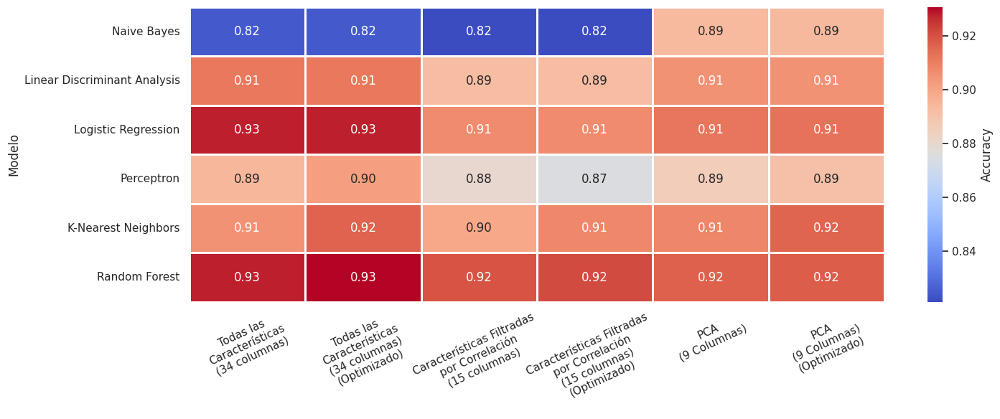

In [ ]:
plt.figure(figsize=(15, 6))
ax = sns.heatmap(df_results[columnas_reordenadas],
            cmap="coolwarm",
            annot=True,
            fmt=".2f",
            linewidths=1,
            cbar_kws={"shrink": 1, "label": "Accuracy"})

ax.set_xticklabels(ax.get_xticklabels(), rotation=25, horizontalalignment='center')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
plt.tight_layout()
plt.show()

En términos de Accuracy Promedio *Naive Bayes* y *Linear Discriminant Analysis* no presentan ningun cambio, aunque esto era esperable, ya que los hiperparámetros optimos coinciden con los de Defaul para ambos modelos.

A simple vista pareciera que solo hubo una leve mejoría (~0.01%) en *K-Nearest Neighbors* y *Random Forest*.

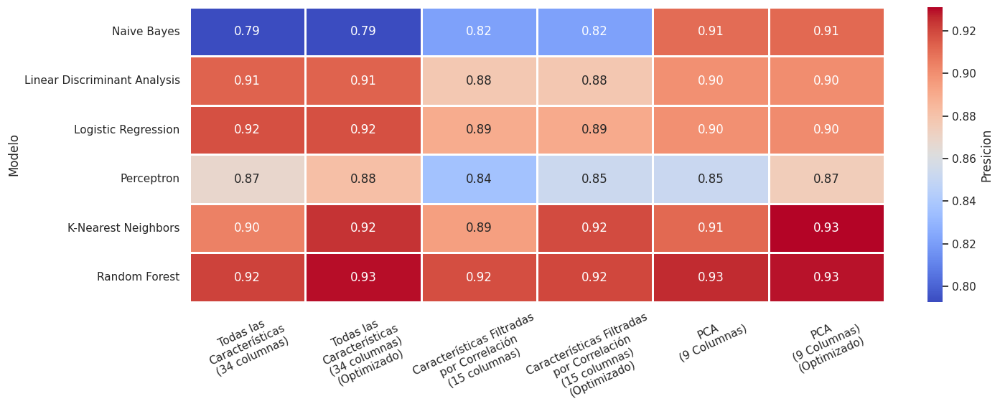

In [ ]:
plt.figure(figsize=(15, 6))
ax = sns.heatmap(df_prec[columnas_reordenadas],
            cmap="coolwarm",
            annot=True,
            fmt=".2f",
            linewidths=1,
            cbar_kws={"shrink": 1, "label": "Presicion"})
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, horizontalalignment='center')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
plt.tight_layout()
plt.show()

En cuanto a la Presicion Mediocampista, solo los modelos *Perceptron*, *K-Nearest Neighbors* y *Random Forest* tuvieron una leve mejoría.
Todo esto comparando los modelos por Default con su version Optimizada. Luego se analizará por set de datos.

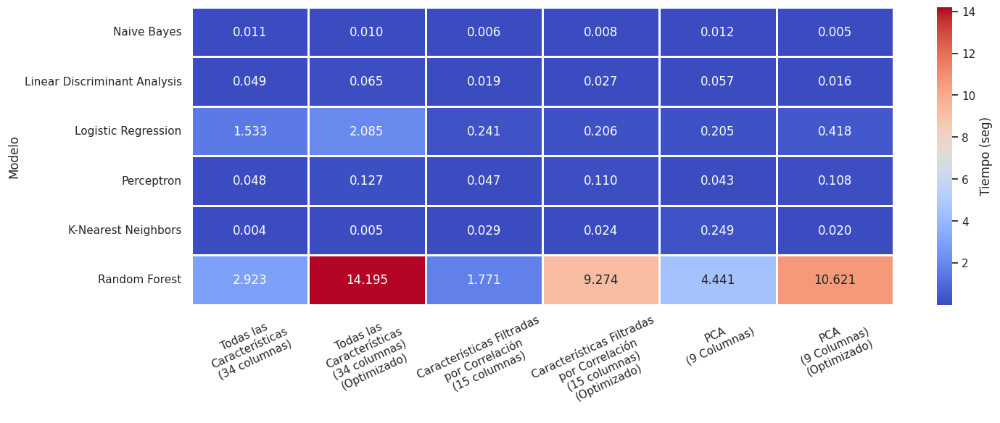

In [ ]:
plt.figure(figsize=(15, 6))
ax = sns.heatmap(df_times[columnas_reordenadas],
            cmap="coolwarm",
            annot=True,
            fmt=".3f",
            linewidths=1,
            cbar_kws={"shrink": 1, "label": "Tiempo (seg)"})
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, horizontalalignment='center')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
plt.tight_layout()
plt.show()

Viendo los tiempos de entrenamientos, los modelos de ensambles son los que mas tardan, lo que es obvio ya que se entrenan cada uno de los árboles que lo componen.

Para hacer un examen mas riguroso de la mejora de los rendimientos, hay que analizar las distribuciones de los valores de estas métricas en cada pliegue y luego hacer una prueba de comparación de medias, mediante una prueba t-Student, de tal manera que pueda concluirse con mejor criterio si hubo una mejora significativa o no, al usar hiperparamatros optimizados.

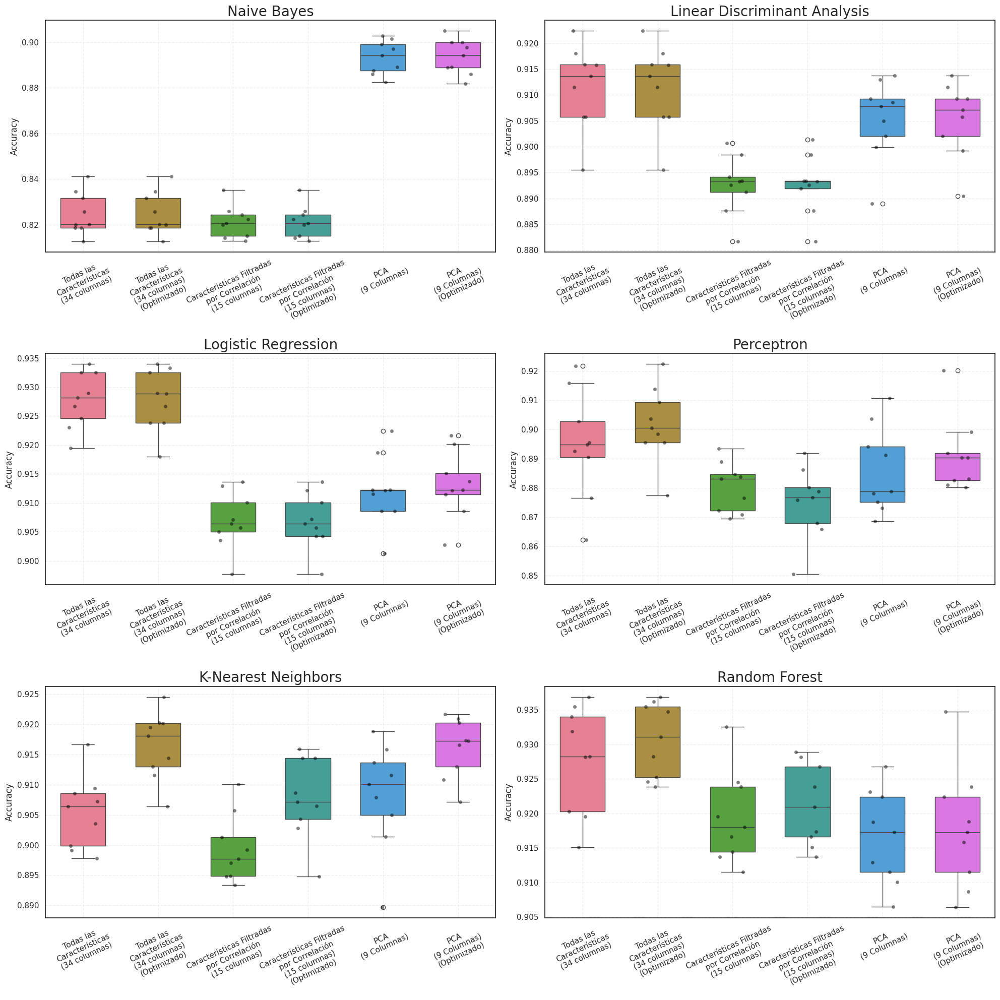

In [ ]:
plot_data = []
for model_name, data_dict in accu_filtrado.items():
    for dataset_name, accuracies in data_dict.items():
        for acc in accuracies:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Accuracy': acc
            })

df_plot = pd.DataFrame(plot_data)

fig, axes = plt.subplots(3, 2, figsize=(20, 20))
axes = axes.flatten()

palette = sns.color_palette("husl", len(columnas_reordenadas))

for i, model_name in enumerate(accu_values.keys()):
    model_data = df_plot[df_plot['Modelo'] == model_name]

    sns.boxplot(
        x='Dataset',
        y='Accuracy',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        width=0.6,
        palette=palette
    )

    sns.stripplot(
        x='Dataset',
        y='Accuracy',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Accuracy', fontsize=12)
    axes[i].tick_params(axis='x', rotation=25)
    axes[i].grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

Viendo las graficas de Boxplots, comparando los set de datos de a pares (Default-Optimizado), no se ve una gran diferencia en el rendimiento.Solo en *K-Nearest Neighbors* se nota una leve mojoría en los 3 set de Datos, mientras que *Random Forest* y *Perceptron*, lo demuestran en el set de datos completos.

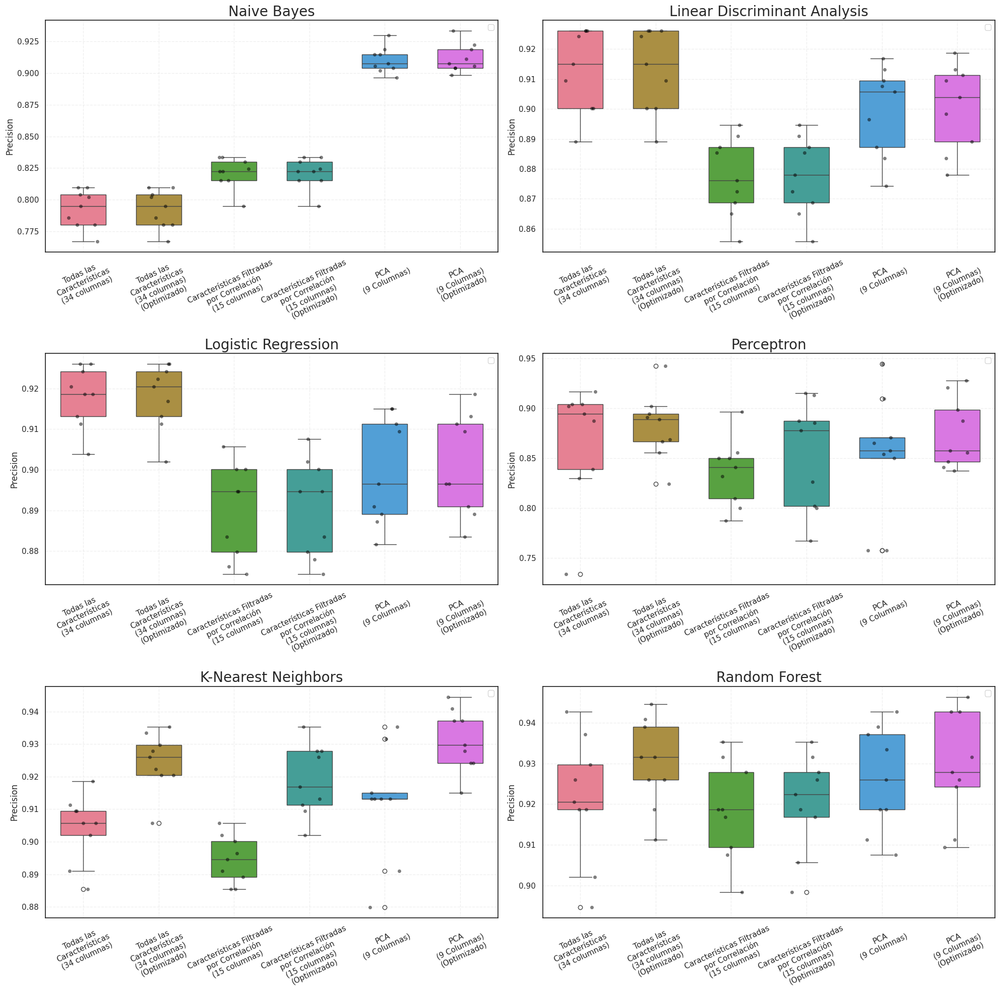

In [ ]:
plot_data = []
for model_name, data_dict in prec_filtrado.items():
    for dataset_name, precisions in data_dict.items():
        for prec in precisions:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Precision': prec
            })

df_plot = pd.DataFrame(plot_data)

fig, axes = plt.subplots(3, 2, figsize=(20, 20))
axes = axes.flatten()

palette = sns.color_palette("husl", len(columnas_reordenadas))

for i, model_name in enumerate(prec_values.keys()):
    model_data = df_plot[df_plot['Modelo'] == model_name]

    sns.boxplot(
        x='Dataset',
        y='Precision',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        width=0.6,
        palette=palette
    )

    sns.stripplot(
        x='Dataset',
        y='Precision',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Precision', fontsize=12)
    axes[i].tick_params(axis='x', rotation=25)
    axes[i].grid(True, linestyle='--', alpha=0.3)
    axes[i].legend()

plt.tight_layout()
plt.show()

Mismo ocurre con el Presicion Mediocampista, solo en *K-Nearest Neighbors* puede verse una mejora leve en los valores.

Resta ver que dicen las pruebas t-Student de comparación de medias.

In [ ]:
pares_comparacion = [
    ('Todas las\nCaracterísticas\n(34 columnas)', 'Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)'),
    ('Características Filtradas\npor Correlación\n(15 columnas)', 'Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)'),
    ('PCA\n(9 Columnas)', 'PCA\n(9 Columnas)\n(Optimizado)')
]

In [ ]:
for model_name, data_dict in accu_filtrado.items():
    print(f"\nResultados para {model_name}")

    for base, optimizado in pares_comparacion:
        data_base = data_dict[base]
        data_opt = data_dict[optimizado]

        t_stat, p_value = ttest_rel(data_base, data_opt)

        mean_diff = np.mean(data_opt) - np.mean(data_base)
        diferencia = "MEJORO" if mean_diff > 0 else "EMPEORO"

        print(f"\nComparación: {base} vs {optimizado}")
        print(f"Media Base: {np.mean(data_base):.4f}")
        print(f"Media Optimizado: {np.mean(data_opt):.4f}")
        print(f"Diferencia: {mean_diff:.4f} ({diferencia})")
        print(f"p-value: {p_value:.4f}")
        if p_value < 0.05:
            print(f"Resultado: Diferencias significativas ({diferencia})")
        else:
            print("Resultado: No hay diferencias significativas")
        print("\n")


Resultados para Naive Bayes

Comparación: Todas las
Características
(34 columnas) vs Todas las
Características
(34 columnas)
(Optimizado)
Media Base: 0.8249
Media Optimizado: 0.8249
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: No hay diferencias significativas



Comparación: Características Filtradas
por Correlación
(15 columnas) vs Características Filtradas
por Correlación
(15 columnas)
(Optimizado)
Media Base: 0.8212
Media Optimizado: 0.8212
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: No hay diferencias significativas



Comparación: PCA
(9 Columnas) vs PCA
(9 Columnas)
(Optimizado)
Media Base: 0.8933
Media Optimizado: 0.8936
Diferencia: 0.0003 (MEJORO)
p-value: 0.4025
Resultado: No hay diferencias significativas



Resultados para Linear Discriminant Analysis

Comparación: Todas las
Características
(34 columnas) vs Todas las
Características
(34 columnas)
(Optimizado)
Media Base: 0.9116
Media Optimizado: 0.9116
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: N

In [ ]:
for model_name, data_dict in prec_filtrado.items():
    print(f"\nResultados para {model_name}")

    for base, optimizado in pares_comparacion:
        data_base = data_dict[base]
        data_opt = data_dict[optimizado]

        t_stat, p_value = ttest_rel(data_base, data_opt)

        mean_diff = np.mean(data_opt) - np.mean(data_base)
        diferencia = "MEJORO" if mean_diff > 0 else "EMPEORO"

        print(f"\nComparación: {base} vs {optimizado}")
        print(f"Media Base: {np.mean(data_base):.4f}")
        print(f"Media Optimizado: {np.mean(data_opt):.4f}")
        print(f"Diferencia: {mean_diff:.4f} ({diferencia})")
        print(f"p-value: {p_value:.4f}")
        if p_value < 0.05:
            print(f"Resultado: Diferencias significativas ({diferencia})")
        else:
            print("Resultado: No hay diferencias significativas")
        print("\n")


Resultados para Naive Bayes

Comparación: Todas las
Características
(34 columnas) vs Todas las
Características
(34 columnas)
(Optimizado)
Media Base: 0.7926
Media Optimizado: 0.7926
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: No hay diferencias significativas



Comparación: Características Filtradas
por Correlación
(15 columnas) vs Características Filtradas
por Correlación
(15 columnas)
(Optimizado)
Media Base: 0.8213
Media Optimizado: 0.8213
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: No hay diferencias significativas



Comparación: PCA
(9 Columnas) vs PCA
(9 Columnas)
(Optimizado)
Media Base: 0.9105
Media Optimizado: 0.9117
Diferencia: 0.0012 (MEJORO)
p-value: 0.2191
Resultado: No hay diferencias significativas



Resultados para Linear Discriminant Analysis

Comparación: Todas las
Características
(34 columnas) vs Todas las
Características
(34 columnas)
(Optimizado)
Media Base: 0.9129
Media Optimizado: 0.9129
Diferencia: 0.0000 (EMPEORO)
p-value: nan
Resultado: N

Los resultados de las pruebas indican que solo hubo una mejora significativa en las métricas, en todos los set de datos, para el modelo *K-Nearest Neighbors* optimizado, para accuracy con *Random Forest* y el set de datos completo y para presicion mediocampista con *Random Forest* y set de datos reducido por Correlación. El resto de commbinaciones no muestra una diferencia significativa.

De todas formas se optó por conservar los modelos optimizados, descartando de las opciones a elegir como modelo final, los modelos con hiperparametros por Defaul.

In [ ]:
df_results = df_results.drop(columns=['Todas las\nCaracterísticas\n(34 columnas)',
                                      'Características Filtradas\npor Correlación\n(15 columnas)',
                                      'PCA\n(9 Columnas)'], axis = 1)
df_results

,Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,
Naive Bayes,0.824857,0.821230,0.893609
Linear Discriminant Analysis,0.911582,0.892641,0.905376
Logistic Regression,0.927782,0.906827,0.913113
Perceptron,0.901828,0.874909,0.891028
K-Nearest Neighbors,0.916418,0.907633,0.916096
Random Forest,0.930685,0.921255,0.917707


In [ ]:
df_prec = df_prec.drop(columns=['Todas las\nCaracterísticas\n(34 columnas)',
                                      'Características Filtradas\npor Correlación\n(15 columnas)',
                                      'PCA\n(9 Columnas)'], axis = 1)
df_prec

,Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,
Naive Bayes,0.792565,0.821319,0.911686
Linear Discriminant Analysis,0.912918,0.877593,0.900596
Logistic Regression,0.918053,0.890532,0.901006
Perceptron,0.881701,0.852742,0.874718
K-Nearest Neighbors,0.924625,0.918875,0.931197
Random Forest,0.929965,0.920312,0.929144


In [ ]:
df_times = df_times.drop(columns=['Todas las\nCaracterísticas\n(34 columnas)',
                                    'Características Filtradas\npor Correlación\n(15 columnas)',
                                    'PCA\n(9 Columnas)'], axis = 1)
df_times

,Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado),Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado),PCA\n(9 Columnas)\n(Optimizado)
Modelo,,,
Naive Bayes,0.009863,0.007531,0.004933
Linear Discriminant Analysis,0.065305,0.026581,0.016013
Logistic Regression,2.084855,0.205867,0.418354
Perceptron,0.126749,0.110041,0.108371
K-Nearest Neighbors,0.004550,0.023712,0.020194
Random Forest,14.195482,9.274156,10.621020


In [ ]:
for model_name, model_results in accu_filtrado.items():
    accu_filtrado[model_name] = {}
    for name, accuracy_scores in model_results.items():
        if '(Optimizado)' in name:
            accu_filtrado[model_name][name] = accuracy_scores

for model_name, model_results in prec_filtrado.items():
    prec_filtrado[model_name] = {}
    for name, prec_scores in model_results.items():
        if '(Optimizado)' in name:
            prec_filtrado[model_name][name] = prec_scores

for model_name, model_results in times_filtrado.items():
    times_filtrado[model_name] = {}
    for name, time_scores in model_results.items():
        if '(Optimizado)' in name:
            times_filtrado[model_name][name] = time_scores

Para analizar con que set de datos se entrenará el modelo final, se realizaron prubas ANOVA para evaluar diferencias entre medias de los modelos entrenados con los 3 tipos de set de datos.

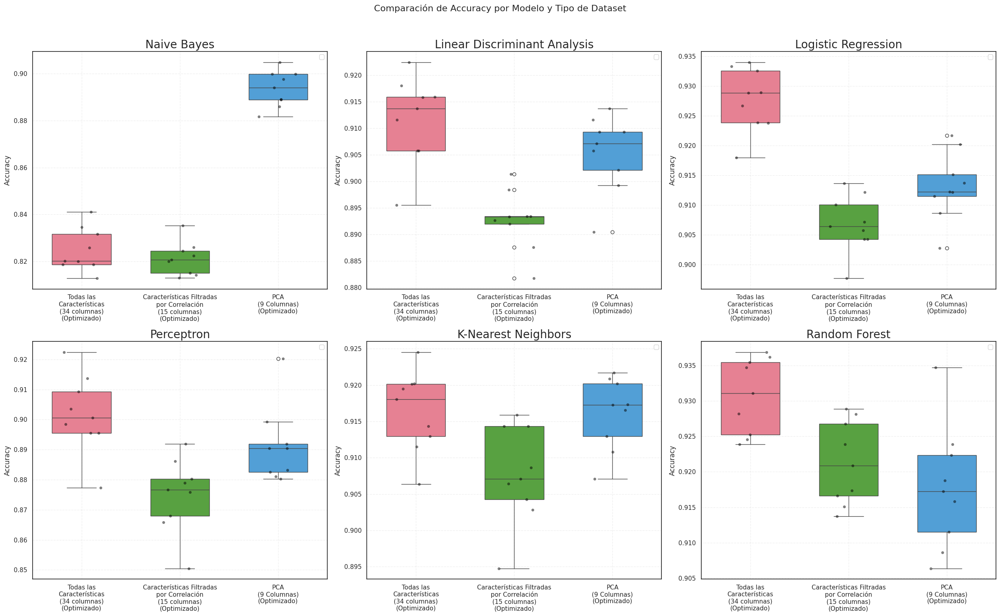

In [ ]:
columnas_reordenadas = [
    'Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)',
    'Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)',
    'PCA\n(9 Columnas)\n(Optimizado)'
]

plot_data = []
for model_name, data_dict in accu_filtrado.items():
    for dataset_name, accuracies in data_dict.items():
        for acc in accuracies:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Accuracy': acc
            })

df_plot = pd.DataFrame(plot_data)

fig, axes = plt.subplots(2, 3, figsize=(25, 15))
fig.suptitle('Comparación de Accuracy por Modelo y Tipo de Dataset', fontsize=16, y=1.02)
axes = axes.flatten()

palette = sns.color_palette("husl", len(columnas_reordenadas))

for i, model_name in enumerate(accu_filtrado.keys()):
    model_data = df_plot[df_plot['Modelo'] == model_name]

    sns.boxplot(
        x='Dataset',
        y='Accuracy',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        width=0.6,
        palette=palette
    )

    sns.stripplot(
        x='Dataset',
        y='Accuracy',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Accuracy', fontsize=12)
    axes[i].tick_params(axis='x', rotation=0)
    axes[i].grid(True, linestyle='--', alpha=0.3)
    axes[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
results = accu_filtrado.copy()
anova_results = []

for model_name in results.keys():
    data_comp = results[model_name].get('Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)', [])
    data_selec = results[model_name].get('Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)', [])
    data_pca = results[model_name].get('PCA\n(9 Columnas)\n(Optimizado)', [])

    if data_comp and data_selec and data_pca:

        f_stat, p_value = f_oneway(data_comp, data_selec, data_pca)

        anova_results.append({
            'Modelo': model_name,
            'F-statistic': f_stat,
            'p-value': p_value,
            'Significativo (p < 0.05)': p_value < 0.05,
            'Media Todas': np.mean(data_comp),
            'Media Filtradas': np.mean(data_selec),
            'Media PCA': np.mean(data_pca),
        })

anova_df = pd.DataFrame([{
    'Modelo': x['Modelo'],
    'F-statistic': x['F-statistic'],
    'p-value': x['p-value'],
    'Significativo': x['Significativo (p < 0.05)'],
    'Media Todas': x['Media Todas'],
    'Media Filtradas': x['Media Filtradas'],
    'Media PCA': x['Media PCA']
} for x in anova_results])

print("Resultados ANOVA para cada modelo:")
print("="*80)
print(anova_df.to_string(index=False))
print("="*80)

Resultados ANOVA para cada modelo:
                      Modelo  F-statistic      p-value  Significativo  Media Todas  Media Filtradas  Media PCA
                 Naive Bayes   235.197921 1.712526e-16           True     0.824857         0.821230   0.893609
Linear Discriminant Analysis    16.837701 2.695550e-05           True     0.911582         0.892641   0.905376
         Logistic Regression    37.497514 4.122630e-08           True     0.927782         0.906827   0.913113
                  Perceptron    10.508882 5.271422e-04           True     0.901828         0.874909   0.891028
         K-Nearest Neighbors     6.690513 4.905918e-03           True     0.916418         0.907633   0.916096
               Random Forest     8.795423 1.363207e-03           True     0.930685         0.921255   0.917707


En términos de Accuracy, los resultados de la prueba ANOVA, concluyen que hay al menos un set de datos que se distingue del resto. Viendo los boxplots con las distribuciones de los puntos, puede concluirse que, salvo en *Naive Bayes*, el mejor resultado se obtuvo con el set de datos completo.

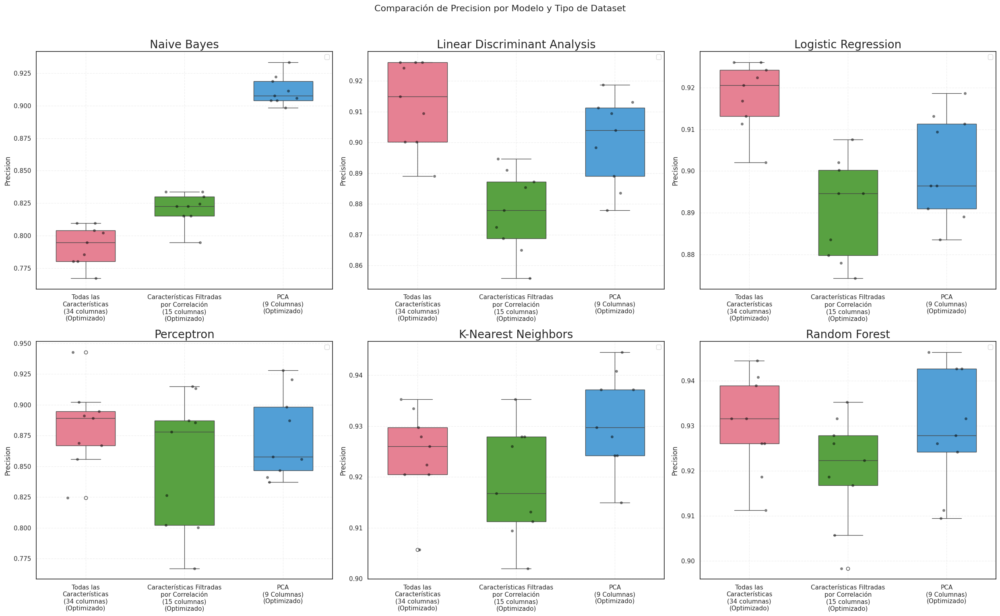

In [ ]:
plot_data = []

for model_name, data_dict in prec_filtrado.items():
    for dataset_name, precisions in data_dict.items():
        for prec in precisions:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Precision': prec
            })

df_plot = pd.DataFrame(plot_data)

fig, axes = plt.subplots(2, 3, figsize=(25, 15))
fig.suptitle('Comparación de Precision por Modelo y Tipo de Dataset', fontsize=16, y=1.02)
axes = axes.flatten()

palette = sns.color_palette("husl", len(columnas_reordenadas))

for i, model_name in enumerate(times_filtrado.keys()):
    model_data = df_plot[df_plot['Modelo'] == model_name]

    sns.boxplot(
        x='Dataset',
        y='Precision',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        width=0.6,
        palette=palette
    )

    sns.stripplot(
        x='Dataset',
        y='Precision',
        data=model_data,
        order=columnas_reordenadas,
        ax=axes[i],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )

    axes[i].set_title(model_name, fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Precision', fontsize=12)
    axes[i].tick_params(axis='x', rotation=0)
    axes[i].grid(True, linestyle='--', alpha=0.3)
    axes[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
results = prec_filtrado.copy()
anova_results = []

for model_name in results.keys():
    data_comp = results[model_name].get('Todas las\nCaracterísticas\n(34 columnas)\n(Optimizado)', [])
    data_selec = results[model_name].get('Características Filtradas\npor Correlación\n(15 columnas)\n(Optimizado)', [])
    data_pca = results[model_name].get('PCA\n(9 Columnas)\n(Optimizado)', [])

    if data_comp and data_selec and data_pca:

        f_stat, p_value = f_oneway(data_comp, data_selec, data_pca)

        anova_results.append({
            'Modelo': model_name,
            'F-statistic': f_stat,
            'p-value': p_value,
            'Significativo (p < 0.05)': p_value < 0.05,
            'Media Todas': np.mean(data_comp),
            'Media Filtradas': np.mean(data_selec),
            'Media PCA': np.mean(data_pca),
        })

anova_df = pd.DataFrame([{
    'Modelo': x['Modelo'],
    'F-statistic': x['F-statistic'],
    'p-value': x['p-value'],
    'Significativo': x['Significativo (p < 0.05)'],
    'Media Todas': x['Media Todas'],
    'Media Filtradas': x['Media Filtradas'],
    'Media PCA': x['Media PCA']
} for x in anova_results])

print("Resultados ANOVA para cada modelo:")
print("="*80)
print(anova_df.to_string(index=False))
print("="*80)

Resultados ANOVA para cada modelo:
                      Modelo  F-statistic      p-value  Significativo  Media Todas  Media Filtradas  Media PCA
                 Naive Bayes   209.650963 6.340733e-16           True     0.792565         0.821319   0.911686
Linear Discriminant Analysis    15.303882 5.193763e-05           True     0.912918         0.877593   0.900596
         Logistic Regression    14.491024 7.464315e-05           True     0.918053         0.890532   0.901006
                  Perceptron     1.170646 3.272579e-01          False     0.881701         0.852742   0.874718
         K-Nearest Neighbors     3.576720 4.369814e-02           True     0.924625         0.918875   0.931197
               Random Forest     1.768613 1.920846e-01          False     0.929965         0.920312   0.929144


En términos de Presicion Mediocampista, la prueba ANOVA solo reconoce diferencias significativas en 4 de los 6 modelos, donde el set de datos completo funciona mejor en *Linear Discriminant Analysis* y *Logistic Regression*, mientras que el set de datos reducidos con PCA funciona mejor en *Naive Bayes* y *K-Nearest Neighbors*.

In [ ]:
plot_data = []
for model_name, data_dict in accu_filtrado.items():
    for dataset_name, accuracies in data_dict.items():
        for acc in accuracies:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Valor': acc,
                'Metrica': 'Accuracy'
            })

for model_name, data_dict in prec_filtrado.items():
    for dataset_name, precisions in data_dict.items():
        for prec in precisions:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Valor': prec,
                'Metrica': 'Precision (Mediocampistas)'
            })

for model_name, data_dict in times_filtrado.items():
    for dataset_name, tiempos in data_dict.items():
        for time in tiempos:
            plot_data.append({
                'Modelo': model_name,
                'Dataset': dataset_name,
                'Valor': time,
                'Metrica': 'Tiempo de Entrenamiento'
            })

df_plot = pd.DataFrame(plot_data)

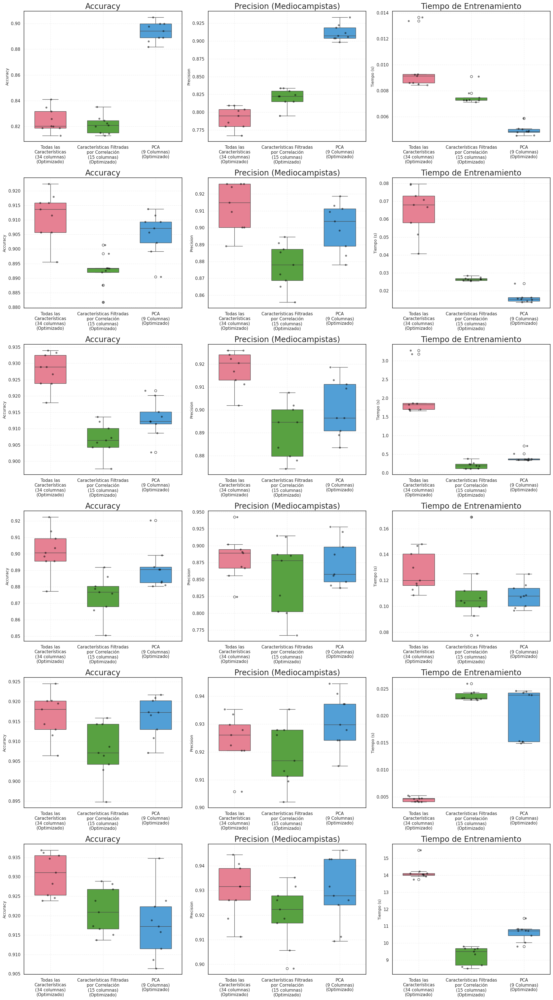

In [ ]:
n_models = len(accu_filtrado.keys())
fig, axes = plt.subplots(n_models, 3, figsize=(20, 6*n_models))

palette = sns.color_palette("husl", len(columnas_reordenadas))

for i, model_name in enumerate(accu_filtrado.keys()):
    acc_data = df_plot[(df_plot['Modelo'] == model_name) &
                      (df_plot['Metrica'] == 'Accuracy')]

    sns.boxplot(
        x='Dataset',
        y='Valor',
        data=acc_data,
        order=columnas_reordenadas,
        ax=axes[i, 0],
        width=0.6,
        palette=palette
    )
    sns.stripplot(
        x='Dataset',
        y='Valor',
        data=acc_data,
        order=columnas_reordenadas,
        ax=axes[i, 0],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )
    axes[i, 0].set_title(f'Accuracy', fontsize=20)
    axes[i, 0].set_xlabel('')
    axes[i, 0].set_ylabel('Accuracy', fontsize=10)
    axes[i, 0].tick_params(axis='x', rotation=0)
    axes[i, 0].grid(True, linestyle='--', alpha=0.3)

    prec_data = df_plot[(df_plot['Modelo'] == model_name) &
                       (df_plot['Metrica'] == 'Precision (Mediocampistas)')]

    sns.boxplot(
        x='Dataset',
        y='Valor',
        data=prec_data,
        order=columnas_reordenadas,
        ax=axes[i, 1],
        width=0.6,
        palette=palette
    )
    sns.stripplot(
        x='Dataset',
        y='Valor',
        data=prec_data,
        order=columnas_reordenadas,
        ax=axes[i, 1],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )
    axes[i, 1].set_title(f'Precision (Mediocampistas)', fontsize=20)
    axes[i, 1].set_xlabel('')
    axes[i, 1].set_ylabel('Precision', fontsize=10)
    axes[i, 1].tick_params(axis='x', rotation=0)
    axes[i, 1].grid(True, linestyle='--', alpha=0.3)

    time_data = df_plot[(df_plot['Modelo'] == model_name) &
                       (df_plot['Metrica'] == 'Tiempo de Entrenamiento')]

    sns.boxplot(
        x='Dataset',
        y='Valor',
        data=time_data,
        order=columnas_reordenadas,
        ax=axes[i, 2],
        width=0.6,
        palette=palette
    )
    sns.stripplot(
        x='Dataset',
        y='Valor',
        data=time_data,
        order=columnas_reordenadas,
        ax=axes[i, 2],
        color='black',
        alpha=0.5,
        jitter=0.2,
        size=5
    )
    axes[i, 2].set_title(f'Tiempo de Entrenamiento', fontsize=20)
    axes[i, 2].set_xlabel('')
    axes[i, 2].set_ylabel('Tiempo (s)', fontsize=10)
    axes[i, 2].tick_params(axis='x', rotation=0)
    axes[i, 2].grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

Se optó por entrenar los modelos con el set de datos completos, aprovechando que en este caso no tiene muchas características (aunque si muchas muestras). En casos donde el numero de columnas sea mucho mayor, es mucho mas comveniente usar un set de datos reducido con PCA. La ventaja es que no hay una gran desmejoría en el rendimiento, y su tiempo de entrenamiento en general puede llegar a ser menor. La desventaja es que se piere interpretabilidad de los resultados, cosa que se priorizó en este caso de análisis.

In [ ]:
#Preparación de todos los set de datos

df_24_comp = df_24.drop(columns=['Posición'])
df_25_comp = df_25.drop(columns=['Posición'])
df_24_multi_comp = df_24_multi.drop(columns=['Posición'])

col_comun = [col for col in df_24_comp.columns if col in df_25_comp.columns]
df_24_comp = df_24_comp[col_comun]
df_25_comp = df_25_comp[col_comun]
df_24_multi_comp = df_24_multi_comp[col_comun]

scaler_comp = StandardScaler().fit(df_24_comp)
df_24_comp_scaled = pd.DataFrame(scaler_comp.transform(df_24_comp), columns=df_24_comp.columns)
df_25_comp_scaled = pd.DataFrame(scaler_comp.transform(df_25_comp), columns=df_25_comp.columns)
df_24_multi_comp_scaled = pd.DataFrame(scaler_comp.transform(df_24_multi_comp), columns=df_24_multi_comp.columns)

X_comp_24 = pd.concat([df_24_comp_scaled, df_dummies_24], axis=1)
X_comp_25 = pd.concat([df_25_comp_scaled, df_dummies_25], axis=1)
X_comp_24_multi = pd.concat([df_24_multi_comp_scaled, df_dummies_24_multi], axis=1)

In [ ]:
# Entrenamiento y cálculo de métricas finales

results = {}

for model_name, model in best_models_complete.items():

    print(f"Entrenando {model_name}")

    model.fit(X_comp_24, y_24)
    y_pred = model.predict(X_comp_25)

    accuracy = accuracy_score(y_25, y_pred)
    precision = precision_mediocampista(y_25, y_pred)

    results[model_name] = {
        'Precision': round(precision, 2),
        'Accuracy': round(accuracy, 2),
    }

results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.index.name = 'Modelo'
results_df

Entrenando Naive Bayes
Entrenando Linear Discriminant Analysis
Entrenando Logistic Regression
Entrenando Perceptron
Entrenando K-Nearest Neighbors
Entrenando Random Forest


,Precision,Accuracy
Modelo,,
Naive Bayes,0.71,0.77
Linear Discriminant Analysis,0.87,0.85
Logistic Regression,0.87,0.87
Perceptron,0.90,0.85
K-Nearest Neighbors,0.90,0.89
Random Forest,0.89,0.91


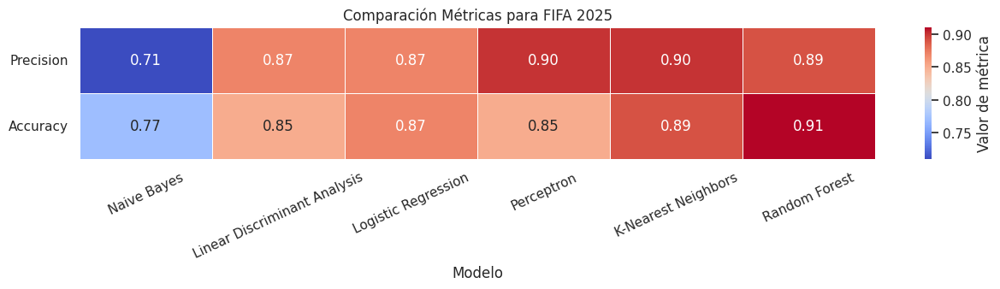

In [ ]:
plt.figure(figsize=(15, 2))
heatmap = sns.heatmap(results_df.T,
                     annot=True,
                     fmt=".2f",
                     cmap="coolwarm",
                     linewidths=.5,
                     cbar_kws={'label': 'Valor de métrica'})

# Ajustar etiquetas
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=25, ha='center')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.title('Comparación Métricas para FIFA 2025')
plt.tight_layout()
plt.show()

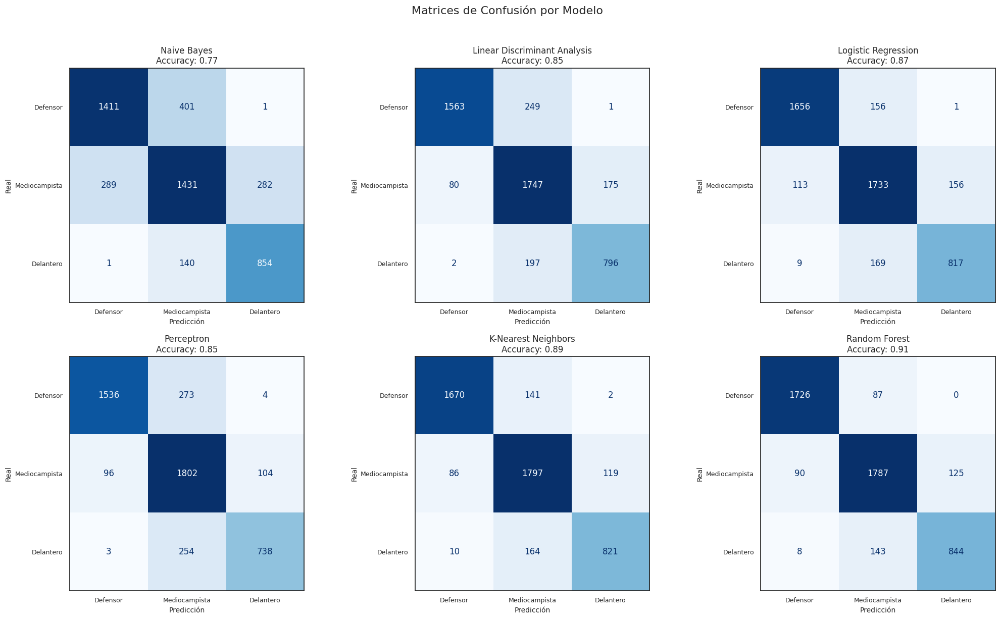

In [ ]:
class_labels = ['Defensor', 'Mediocampista', 'Delantero']

fig, axes = plt.subplots(2, 3, figsize=(21, 12))
fig.suptitle('Matrices de Confusión por Modelo', fontsize=16, y=1.02)

axes = axes.flatten()

for i, (model_name, model) in enumerate(best_models_complete.items()):

    y_pred = model.predict(X_comp_25)
    accuracy = accuracy_score(y_25, y_pred)

    cm = confusion_matrix(y_25, y_pred, labels=[0, 1, 2])

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=axes[i], cmap='Blues', colorbar=False)

    axes[i].set_title(f'{model_name}\nAccuracy: {accuracy:.2f}', fontsize=12)
    axes[i].set_xlabel('Predicción', fontsize=10)
    axes[i].set_ylabel('Real', fontsize=10)

    axes[i].tick_params(axis='both', which='major', labelsize=9)
    axes[i].tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.show()

Como era de esperar, el mejor accuracy, se obtuvo con un *Random Forest*, con una leve desmejoría en su presicion mediocampista, respecto de un *K-Nearest Neighbors*. Será este el modelo entonces que se usará para predecir las posiciones de los "**Indecisos**".

Antes de realizar las predicciones de los "*indecisos*", se puede aprovechar el modelo *Linear Discriminant Analysis* entrenado, para ver otra proyección de los datos en 2 dimensiones.

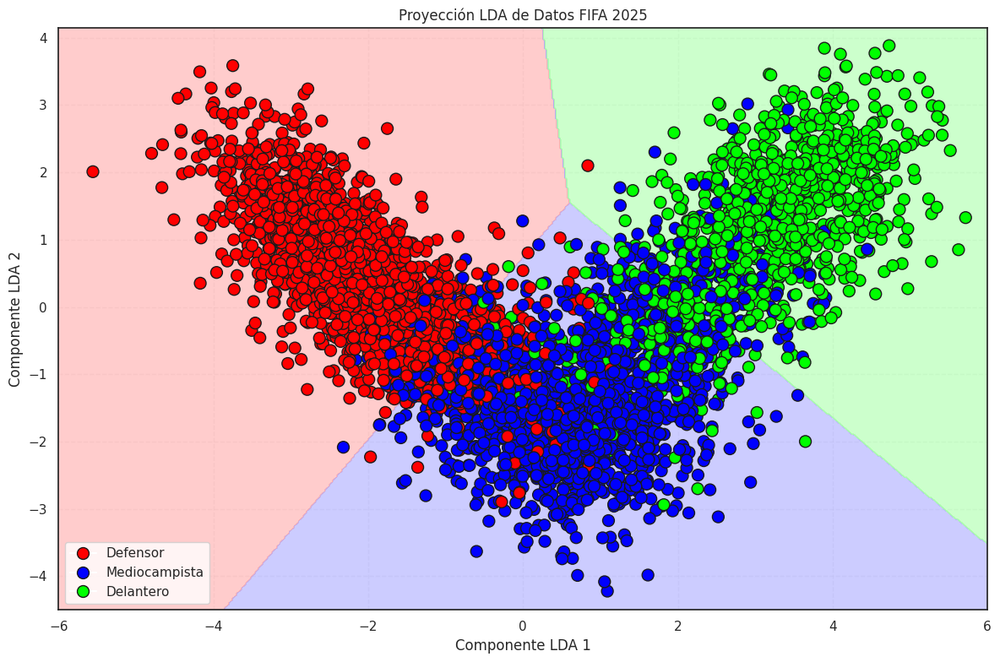

In [ ]:
original_lda = best_models_complete['Linear Discriminant Analysis']

X_train_lda = original_lda.transform(X_comp_24)
X_test_lda = original_lda.transform(X_comp_25)

lda_projected = LinearDiscriminantAnalysis(
    solver=original_lda.solver,
    shrinkage=original_lda.shrinkage,
)

lda_projected.fit(X_train_lda, y_24)

def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

xx, yy = make_meshgrid(X_train_lda[:, 0], X_train_lda[:, 1])
grid_points = np.c_[xx.ravel(), yy.ravel()]

Z = lda_projected.predict(grid_points)
Z = Z.reshape(xx.shape)

plt.figure(figsize=(12, 8))
cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF', '#AAFFAA'])
cmap_bold = ListedColormap(['#FF0000', '#0000FF', '#00FF00'])
bold_colors = cmap_bold.colors
class_labels = ['Defensor', 'Mediocampista', 'Delantero']

plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.6)
plt.scatter(X_test_lda[:, 0], X_test_lda[:, 1], c=y_25, cmap=cmap_bold, edgecolor='k', s=100)

handles = [ plt.Line2D([], [], marker='o', color='w',
                       markerfacecolor=bold_colors[i],
                       markersize=10,
                       label=class_labels[i],
                       markeredgecolor='k') for i in range(3) ]

plt.xlabel('Componente LDA 1')
plt.ylabel('Componente LDA 2')
plt.title('Proyección LDA de Datos FIFA 2025', fontsize=12)
plt.ylim(-4.5, 4.15)
plt.xlim(-6, 6)
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend(handles=handles)
plt.tight_layout()
plt.show()

Tambien es posible ver las importancias de características obtenidas de todos los árboles que componen en ensamble *Random Forest* y analizar cuales son los atributos que mas diferencian a las posiciones.

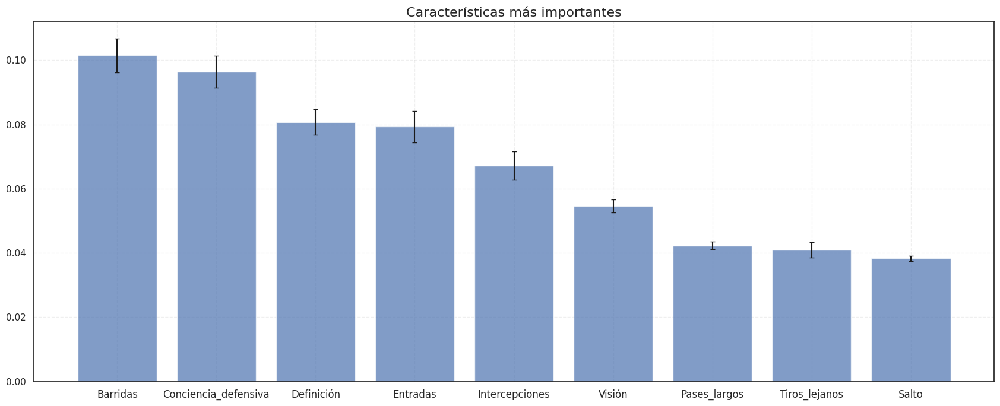

In [ ]:
rf_model = best_models_complete['Random Forest']

importancias = np.array([tree.feature_importances_ for tree in rf_model.estimators_])

importancia_promedio = np.mean(importancias, axis=0)
importancia_std = np.std(importancias, axis=0)
importancia_error = importancia_std / np.sqrt(len(rf_model.estimators_))

importancia_df = pd.DataFrame({
    'Caracteristica': X_comp_24.columns,
    'Importancia_promedio': importancia_promedio,
    'Desviacion_std': importancia_std,
    'Error_estandar': importancia_error
}).sort_values('Importancia_promedio', ascending=False)

plt.figure(figsize=(17, 7))
top_n = 9
plt.bar(importancia_df['Caracteristica'].head(top_n),
        importancia_df['Importancia_promedio'].head(top_n),
        yerr=importancia_df['Error_estandar'].head(top_n),
        align='center', alpha=0.7, capsize=3)

plt.title('Características más importantes', fontsize=16)
plt.xticks(rotation=0, fontsize=12, ha='center')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

Así como tambien las menos importantes y por ende, las posibles características a ser descartadas en proximas pruebas.

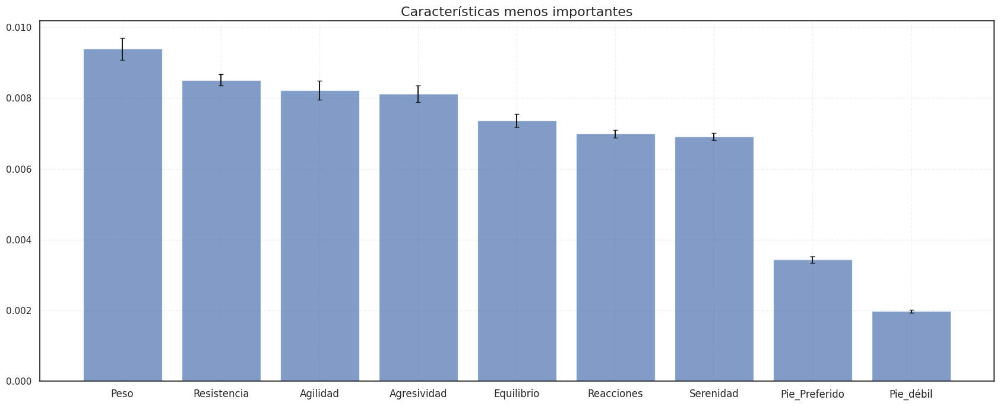

In [ ]:
plt.figure(figsize=(17, 7))
plt.bar(importancia_df['Caracteristica'].tail(top_n),
        importancia_df['Importancia_promedio'].tail(top_n),
        yerr=importancia_df['Error_estandar'].tail(top_n),
        align='center', alpha=0.7, capsize=3)

plt.title('Características menos importantes', fontsize=16)
plt.xticks(rotation=0, fontsize=12, ha='center')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

Por útimo, sería interesante ver las distribuciones de estas características y ver si es que se puede notar una diferenciacion entre posiciones.

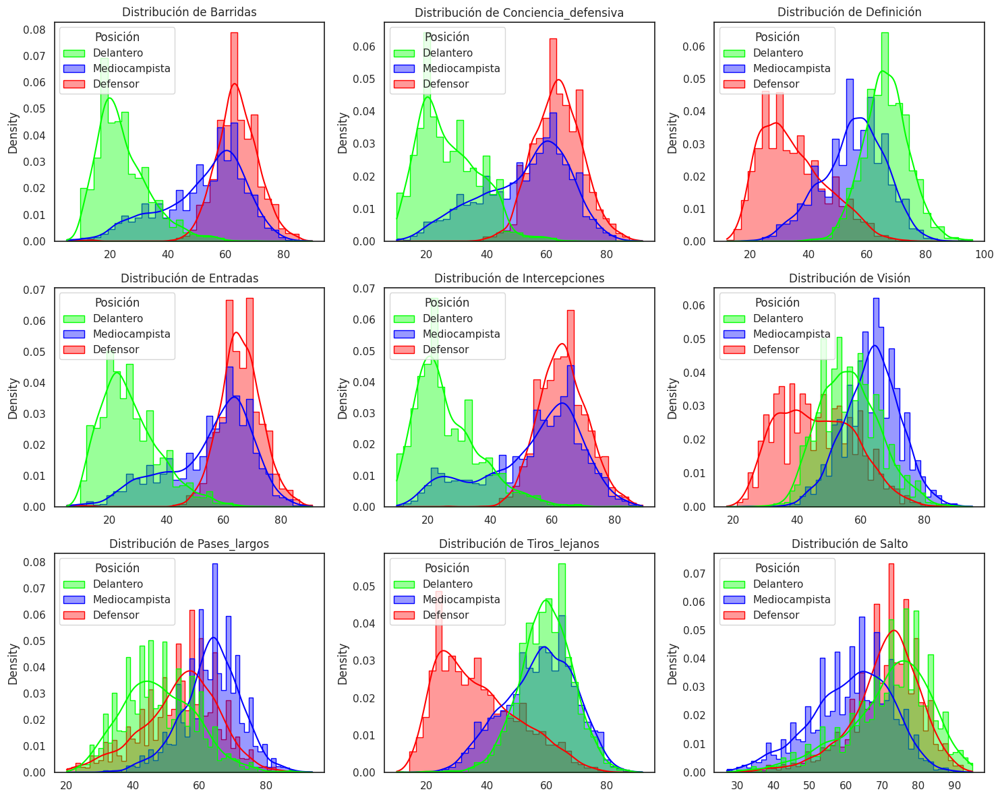

In [ ]:
features_relevantes = importancia_df['Caracteristica'].head(top_n)

palette = {
    'Defensor': '#FF0000',    # Rojo
    'Mediocampista': '#0000FF', # Azul
    'Delantero': '#00FF00'     # Verde
}

n_cols = 3
n_rows = int(np.ceil(len(features_relevantes) / n_cols))
plt.figure(figsize=(15, 12))

for i, feature in enumerate(features_relevantes, 1):
    plt.subplot(n_rows, n_cols, i)

    sns.histplot(
        data=df_24,
        x=feature,
        hue='Posición',
        element='step',
        stat='density',
        common_norm=False,
        kde=True,
        palette=palette,
        alpha=0.4
    )

    plt.title(f'Distribución de {feature}')
    plt.xlabel('')

plt.tight_layout()
plt.show()


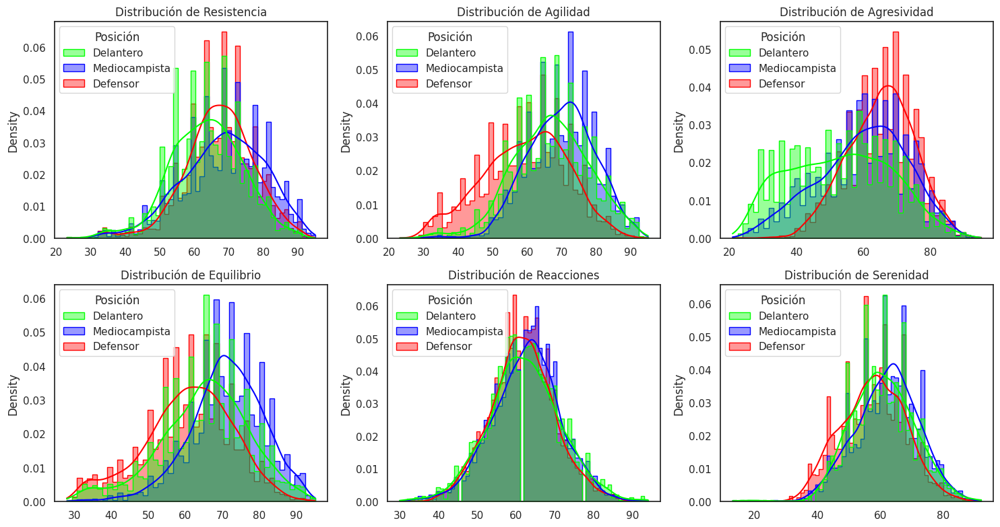

In [ ]:
features_irrelevantes = importancia_df['Caracteristica'][-8:-2]

n_cols = 3
n_rows = int(np.ceil(len(features_irrelevantes) / n_cols))
plt.figure(figsize=(15, 8))

for i, feature in enumerate(features_irrelevantes, 1):
    plt.subplot(n_rows, n_cols, i)

    sns.histplot(
        data=df_24,
        x=feature,
        hue='Posición',
        element='step',
        stat='density',
        common_norm=False,
        kde=True,
        palette=palette,
        alpha=0.4
    )

    plt.title(f'Distribución de {feature}')
    plt.xlabel('')

plt.tight_layout()
plt.show()


Como era de esperarse, las distribuciones de las características menos relevantes no muestran una diferenciación por posiciones.

Ademas, las características relacionadas con los pies del jugador tampoco parecen ser relevantes a la hora de asignarles una posicion en la cancha.

Se realizan las predicciones sobre los datos del DataFrame con posiciones multiples.

In [ ]:
posiciones_predichas = rf_model.predict(X_comp_24_multi)
df_24_multi['Posición_Predicha'] = posiciones_predichas
df_24_multi['Posición_Predicha'] = df_24_multi['Posición_Predicha'].replace({0: 'Defensor',
                                                                             1: 'Mediocampista',
                                                                             2: 'Delantero'})
df_24_multi[['Posición', 'Posición_Predicha']]

,Posición,Posición_Predicha
0,"['Delantero', 'Mediocampista']",Delantero
1,"['Delantero', 'Mediocampista']",Delantero
2,"['Delantero', 'Mediocampista']",Mediocampista
3,"['Delantero', 'Mediocampista']",Mediocampista
4,"['Mediocampista', 'Defensor']",Mediocampista
...,...,...
3865,"['Delantero', 'Mediocampista']",Delantero
3866,"['Delantero', 'Mediocampista']",Mediocampista
3867,"['Mediocampista', 'Defensor']",Mediocampista
3868,"['Mediocampista', 'Defensor']",Mediocampista


Para tener una mejor idea de si las posiciones asignadas son buenas,podemos ver si es que la posición predicha se encuentra o no en la lista de posibles posiciones del jugador.

In [ ]:
defensores = []
mediocampistas = []
delanteros = []

for lista in df_24_multi['Posición'].unique():

    defen = 0
    medio = 0
    delan = 0

    df_temp = df_24_multi[df_24_multi['Posición'] == lista]

    for i in range(df_temp.shape[0]):

        if df_temp['Posición_Predicha'].iloc[i] in lista:

            if df_temp['Posición_Predicha'].iloc[i] == 'Defensor':
                defen += 1
            elif df_temp['Posición_Predicha'].iloc[i] == 'Mediocampista':
                medio += 1
            elif df_temp['Posición_Predicha'].iloc[i] == 'Delantero':
                delan += 1

    defensores.append(defen)
    mediocampistas.append(medio)
    delanteros.append(delan)

df_conteo = {
    'Lista de Posiciones': df_24_multi['Posición'].unique(),
    'Defensor': defensores,
    'Mediocampista': mediocampistas,
    'Delantero': delanteros
}

df_conteo = pd.DataFrame(df_conteo)
df_conteo

,Lista de Posiciones,Defensor,Mediocampista,Delantero
0,"['Delantero', 'Mediocampista']",0,1186,807
1,"['Mediocampista', 'Defensor']",1064,641,0
2,"['Delantero', 'Mediocampista', 'Defensor']",22,51,3
3,"['Delantero', 'Defensor']",33,0,5


Como comentario final, llegado a este punto, y usando todo lo aprendido hasta el momento, es posible volver a empezar y probar cambiar ciertas desiciones tomadas para intentar mejorar aún mas los resultados.

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.table import Table

# Datos de la tabla
headers = ["Lista de Posiciones", "Defensor", "Mediocampista", "Delantero"]
data = [
    [0, "[Delantero, Mediocampista]", 0, 1186, 807],
    [1, "[Mediocampista, Defensor]", 1064, 641, 0],
    [2, "[Delantero, Mediocampista, Defensor]", 22, 51, 3],
    [3, "[Delantero, Defensor]", 33, 0, 5]
]

# Configuración de la figura
fig, ax = plt.subplots(figsize=(10, 4))
ax.axis('off')  # Ocultar ejes

# Crear tabla
table = ax.table(
    cellText=[row[2:] for row in data],  # Solo valores numéricos (columnas 2+)
    colLabels=headers[1:],               # Encabezados de columnas (sin "Lista de Posiciones")
    rowLabels=[row[1] for row in data],   # Texto de la primera columna
    cellLoc='center',
    loc='center'
)

# Estilo de la tabla
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 1.5)

# Resaltar encabezados y primera columna
for (i, j), cell in table.get_celld().items():
    if i == 0 or j == -1:
        cell.set_facecolor('#f2f2f2')
    cell.set_edgecolor('black')
    cell.set_linewidth(1)

plt.savefig('tabla_posiciones.png', bbox_inches='tight', dpi=300)
plt.close()

print("¡Tabla guardada como 'tabla_posiciones.png'!")

¡Tabla guardada como 'tabla_posiciones.png'!
